# SSC_ATACseq_Analysis.Pipeline.AllSamples(Remove Macrophage Final)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 
import seaborn as sns
import os
import sys
import scipy.stats
import matplotlib as mpl
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from compiler.ast import flatten
from sklearn.neighbors import NearestNeighbors
from itertools import groupby
import math
import networkx as nx
import gc
import psutil
import scipy.stats
#import Thestral
from scipy.stats.mstats import gmean
from matplotlib_venn import venn2, venn2_circles
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.neighbors import kneighbors_graph
from sklearn import cluster
from scipy.spatial.distance import pdist
from scipy.stats import pearsonr
import community
import matplotlib.gridspec as gridspec
import random
import itertools


/Users/liuqian/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:11: DeprecationWarning: The compiler package is deprecated and removed in Python 3.x.


In [2]:

#Functions
def Mkdir(DirX):
    if not os.path.exists(DirX):
        os.mkdir(DirX)

def Read(File):
    return pd.read_table(File,sep='\t',index_col=0)

def ReadBed(File):
    Bed=pd.read_table(File,sep='\t',index_col=None,header=None)
    Bed.index=Bed[3]
    return Bed

def Save(DF,File):
    DF.to_csv(File,sep='\t')

def SaveBed(Bed,File):
    Bed.to_csv(File,sep='\t',index=False,header=False)
    
def GetState(i):
    if 'Norm' in i: return 'Norm'
    if 'Arm' in i: return 'Arm'
    if 'Back' in i:return 'Back'

def ReadTable(Infile):return pd.read_table(Infile,sep='\t',index_col=0)

def SizeFactor(DF):return (DF.T/DF.apply(gmean,axis=1)).dropna(axis=1,how='any').apply(np.median,axis=1)

def Ttest1(A,B,Index_List):
    return pd.Series(scipy.stats.ttest_ind(A,B,axis=1)[1],index=Index_List)

def Ttest(A,B,Index_List):
    P=[]
    for i in Index_List:
        _,p=scipy.stats.ttest_ind(list(A.loc[i].dropna()),list(B.loc[i].dropna()))
        P.append(p)
    return pd.Series(P,index=Index_List)


def p_adjust_bh(p):
    p = np.asfarray(p)
    by_descend = p.argsort()[::-1]
    by_orig = by_descend.argsort()
    steps = float(len(p)) / np.arange(len(p), 0, -1)
    q = np.minimum(1, np.minimum.accumulate(steps * p[by_descend]))
    return q[by_orig]

    
# input A/B is DataFrame whose value is after taking log2
def Diff_FDR(A,B,fdc,fdr):
    Indexs=list(set(list(A[(A==0).apply(sum,axis=1)<len(A.columns)].index)+list(B[(B==0).apply(sum,axis=1)<len(B.columns)].index)))
    A2=A.loc[Indexs]
    B2=B.loc[Indexs]
    MeanA=A2.apply(np.mean,axis=1)
    MeanB=B2.apply(np.mean,axis=1)
    FDC=MeanA-MeanB
    Pval=Ttest(A2,B2,Indexs)
    FDR=pd.Series(p_adjust_bh(Pval.values), index=Indexs)
    return FDC,FDR,list(A2[(FDC>fdc)&(FDR<fdr)].index),list(A2[(FDC<-fdc)&(FDR<fdr)].index)
    

def Diff_Pval(A,B,fdc,p):
    Indexs=list(set(list(A[(A==0).apply(sum,axis=1)<len(A.columns)].index)+list(B[(B==0).apply(sum,axis=1)<len(B.columns)].index)))           
    A2=A.loc[Indexs]
    B2=B.loc[Indexs]
    MeanA=A2.apply(np.mean,axis=1)
    MeanB=B2.apply(np.mean,axis=1)
    FDC=MeanA-MeanB
    Pval=Ttest(A2,B2,Indexs)
    return FDC,Pval,list(A2[(FDC>fdc)&(Pval<p)].index),list(A2[(FDC<-fdc)&(Pval<p)].index)
    
    

In [ ]:
#Inputfiles
AllF='./SourceData/atac.count'                                             
AllCommonF='./SourceData/NormSSc.raw.order.txt'
NormF='./SourceData/NormSkin.raw.txt'
ArmF='./SourceData/SSC_Arm_raw.txt'
BackF='./SourceData/SSC_Back_raw.txt'

AllBed='./SourceData/atac.merged.peak.list'
AllCommonBed='./SourceData/NormSScPeaks.bed'
NormBed='./SourceData/Norm/NormSkinPeaks.bed'

#Output Dir
outDir="./OutPut"
outDirAll="./OutPut/All"
outDirNorm="./OutPut/Norm"
outDirAllCommon="./OutPut/AllCommon"
map(Mkdir,[outDir,outDirAll,outDirNorm,outDirAllCommon])

#SNP 
GRASPFile='./SourceData/All_GRASP2_SNP.txt'
GRASPBed='./SourceData/All_GRASP2_SNP.bed'
SNPBedFile="./SourceData/Published_SNPBed.txt"



In [3]:
#Inputfiles
AllF='/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/atac.count'                                             
AllCommonF='/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_NormSScCommon/Add_Macrophage/NormSSc.raw.order.txt'
NormF='/Users/liuqian/Documents/A_SSC_project/A_Code_available/Norm/NormSkin.raw.txt'
ArmF='/Users/liuqian/Documents/A_SSC_project/Arm/SSC_Arm_raw.txt'
BackF='/Users/liuqian/Documents/A_SSC_project/Back/SSC_Back_raw.txt'

AllBed='/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/atac.merged.peak.list'
AllCommonBed='/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_NormSScCommon/Add_Macrophage/NormSScPeaks.bed'
NormBed='/Users/liuqian/Documents/A_SSC_project/Norm/NormSkinPeaks.bed'

#Output Dir
outDir="/Users/liuqian/Documents/A_SSC_project/A_Code_available"
outDirAll="/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac"
outDirNorm="/Users/liuqian/Documents/A_SSC_project/A_Code_available/Norm/Without_Macrophage_And_Mac"
outDirAllCommon="/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_NormSScCommon/Without_Macrophage_And_Mac"
map(Mkdir,[outDir,outDirAll,outDirNorm,outDirAllCommon])

#SNP 
GRASPFile='/Users/liuqian/Documents/ATAC-seq_project/ForLiuQian/All_GRASP2_SNP.txt'
GRASPBed='/Users/liuqian/Documents/A_SSC_project/Norm/SNP_Enrichment/All_GRASP2_SNP.bed'
SNPBedFile="/Users/liuqian/Documents/A_SSC_project/A_Code_available/Published_SNPBed.txt"



In [5]:
#Color
ClusterColorsDict={'CD4':'#EC2427','CD8':'#F15E25','Mac':'#231F20','Fib':'#3B54A4','EC':'#EB0D8C','DC':'#6CBE46','LC':'#34C5F4','KC':'#F6EC13','CD31':'#EB0D8C'}          
ClusterMarkerDict={'Norm':'o','Back':'^','Arm':'s'}
StateColorDict={'Norm':'#1B5B9C','Arm':'#C94540','Back':'coral','Norm-Arm-Back':'#8B8C8F','Arm-Back':'#4D2A7C','Norm-Arm':'#675EA9','Norm-Back':'#4B86C6'} 




# Replicates Plot

In [46]:
Dir=os.path.join(outDirAll, 'Replicates')
Mkdir(Dir)


In [47]:
def NormLog(DF,label,method,O,outDir):
    def log(L):return np.array([math.log(i+1,2) for i in L])
    if method=='QNorm':
        print 'Do QNorm...'
        rank_mean=DF.stack().groupby(DF.rank(method='first').stack().astype(int)).mean()
        DF=DF.rank(method='min').stack().astype(int).map(rank_mean).unstack()
        print 'QNorm Done!'
    if method=='DEseq':
        print 'Do DEseq...'
        SizeFactor=(DF.T/DF.apply(gmean,axis=1)).dropna(axis=1,how='any').apply(np.median,axis=1)
        DF=DF/SizeFactor
        outSizeFactor=os.path.join(outDir,'DEseq_sizeFactors.txt')
        SizeFactor.to_csv(outSizeFactor,sep='\t')
        print 'DEseq Done!'
    DFlog=DF.apply(log)
    if O:
        print 'Output file...'
        outfilelog=os.path.join(outDir,'PeakCount.'+label+'_'+method+'_Normalized.log2.txt')
        outfile=os.path.join(outDir,'PeakCount.'+label+'_'+method+'_Normalized.txt')
        DF.to_csv(outfile,sep='\t')
        DFlog.to_csv(outfilelog,sep='\t')
    return DF,DFlog


df=ReadTable("./SourceData/Replicates/atac.count")             
Alldf_Norm,Alldf_Normlog=NormLog(df,'AllSampleSkin','QNorm',False,None)




Do QNorm...
QNorm Done!


In [48]:
def RepPlot(DF,X,Y,Dir):
    plt.style.use('seaborn-white')
    fig=plt.figure(figsize=(5,5))
    ax=fig.add_axes([0.15,0.15,0.8,0.8])
    ax.hist2d(DF[X],DF[Y],bins=300,cmin=1, cmax=10000,vmin=1,vmax=15,cmap='magma')
    ax.set_ylabel(Y,fontsize=20)
    ax.set_xlabel(X,fontsize=20)
    ax.set_title(str(scipy.stats.pearsonr(DF[X],DF[Y])))   
    ax.tick_params(axis='y',length=0,labelsize=15,direction='out')
    ax.tick_params(axis='x',length=0,labelsize=15,direction='out')
    ax.set_xlim(3,10)
    ax.set_ylim(3,10)
    fig.savefig(os.path.join(Dir,'RepPlot.{}-{}.pdf'.format(X,Y)))
    plt.show()
    

/Users/liuqian/anaconda2/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6497: RuntimeWarning: invalid value encountered in greater
  h[h > cmax] = None


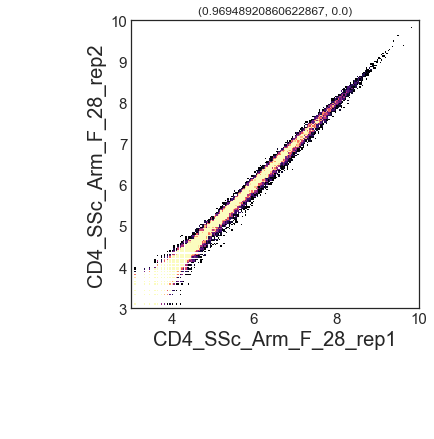

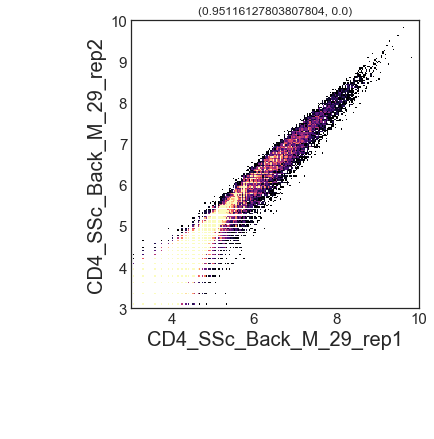

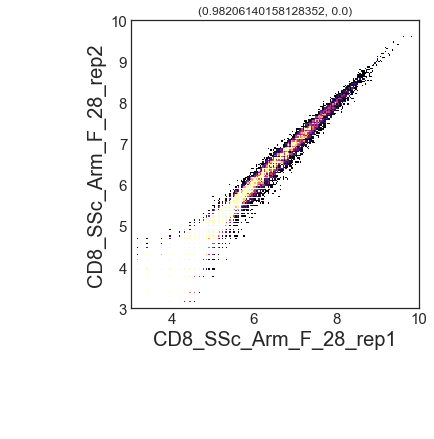

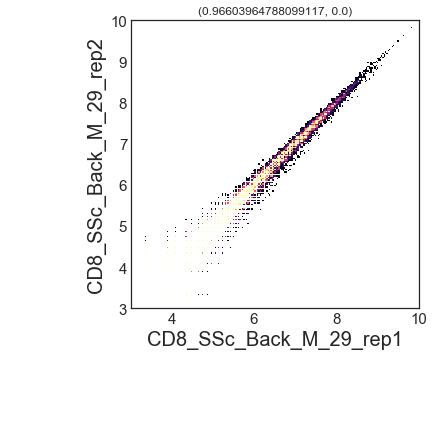

In [19]:
RepPlot(Alldf_Normlog,'CD4_SSc_Arm_F_28_rep1','CD4_SSc_Arm_F_28_rep2',Dir)
RepPlot(Alldf_Normlog,'CD4_SSc_Back_M_29_rep1','CD4_SSc_Back_M_29_rep2',Dir)
RepPlot(Alldf_Normlog,'CD8_SSc_Arm_F_28_rep1','CD8_SSc_Arm_F_28_rep2',Dir)
RepPlot(Alldf_Normlog,'CD8_SSc_Back_M_29_rep1','CD8_SSc_Back_M_29_rep2',Dir)


## QC Analysis

In [20]:
outDir="/Users/liuqian/Documents/A_SSC_project/A_Code_available"
Dir=os.path.join(outDir,'QC')
FragDir=os.path.join(Dir,'FragmentDistribution')
TSSDir=os.path.join(Dir,'TSS')


In [925]:
def get_Fig_ax(x_label,y_label):
    plt.style.use('seaborn-white')
    fig=plt.figure(figsize=(6,5.0))
    ax=fig.add_axes([0.25,0.25,0.55,0.65])
    ax.tick_params(axis='y',length=7,labelsize=30,direction='out')
    ax.tick_params(axis='x',length=7,labelsize=30,direction='out')
    ax.set_ylabel(y_label.capitalize(),fontsize=35)
    ax.set_xlabel(x_label.capitalize(),fontsize=35)
    if x_label=='length':
        ax.set_ylim([-0.0005,0.015])
    elif x_label=='center':
        ax.set_ylim([-1,22])
    return fig,ax

def get_interval(L):
    Int=scipy.stats.norm.interval(0.80,np.mean(L),np.std(L))
    return Int[0],Int[1]

def DrawQC(fig,ax,Xs,Ys,color):
    MeanY=[np.mean(i) for i in Ys]
    Int=[get_interval(i) for i in Ys]
    IntY1=[i[0] for i in Int]
    IntY2=[i[1] for i in Int]
    ax.fill_between(Xs,IntY1,IntY2,edgecolor='none',facecolor=color,alpha=0.2)
    ax.plot(Xs,MeanY,color=color,alpha=1,linewidth=1.5)

def GetQC(File,x_label,y_label):
    DF=ReadTable(File)
    fig,ax=get_Fig_ax(x_label,y_label)
    Xs=[]
    Ys=[]
    for x in sorted(list(set(DF[x_label]))):
        Xs.append(x)
        Ys.append(list(DF[DF[x_label]==x][y_label]))
    return Xs,Ys


    
    

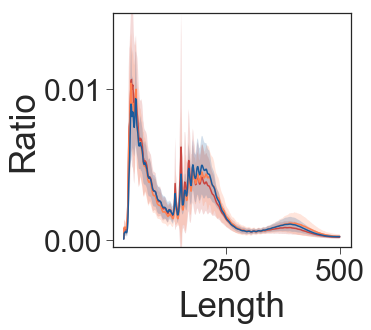

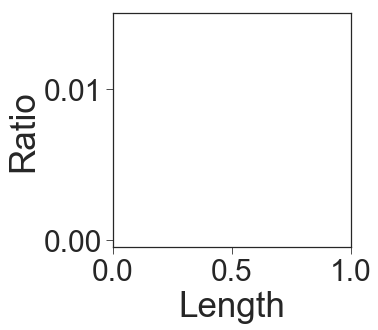

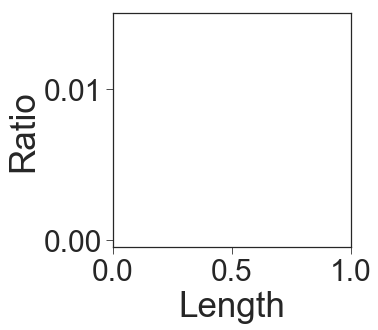

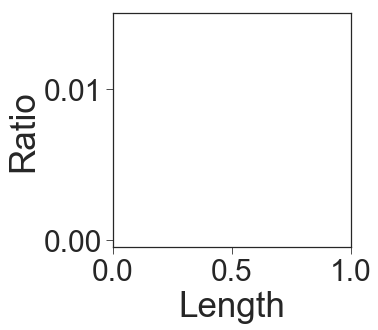

In [926]:
fig1,ax1=get_Fig_ax('length','ratio')
Xs_Arm,Ys_Arm=GetQC(os.path.join(FragDir,'Fragmentdistribution.Arm.txt'),'length','ratio')
Xs_Back,Ys_Back=GetQC(os.path.join(FragDir,'Fragmentdistribution.Back.txt'),'length','ratio')
Xs_Norm,Ys_Norm=GetQC(os.path.join(FragDir,'Fragmentdistribution.Norm.txt'),'length','ratio')
DrawQC(fig1,ax1,Xs_Arm,Ys_Arm,'#C94540')
DrawQC(fig1,ax1,Xs_Back,Ys_Back,'coral')
DrawQC(fig1,ax1,Xs_Norm,Ys_Norm,'#1B5B9C')
fig1.savefig(os.path.join(FragDir, 'Fragmentdistribution.pdf'))
plt.show()



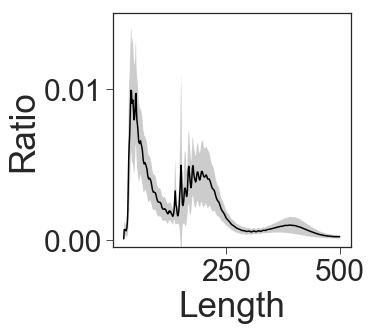

In [927]:
fig1,ax1=get_Fig_ax('length','ratio')
DrawQC(fig1,ax1,Xs_Arm,[Ys_Arm[i]+Ys_Back[i]+Ys_Norm[i] for i in range(len(Ys_Arm))],'k')
fig1.savefig(os.path.join(FragDir, 'Fragmentdistribution.AllState.pdf'))
plt.show()


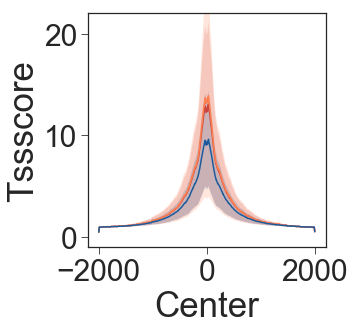

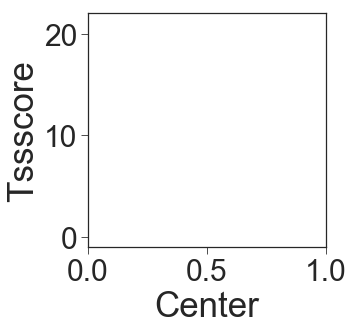

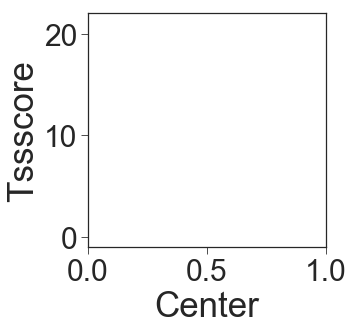

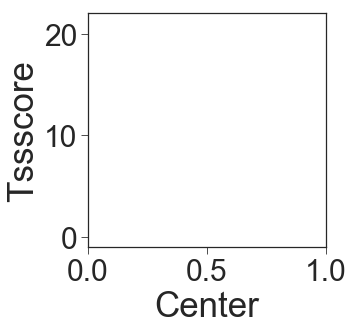

In [928]:
fig2,ax2=get_Fig_ax('center','TSSscore')
Xs_Arm,Ys_Arm=GetQC(os.path.join(TSSDir,'TSSscore.Arm.txt'),'center','TSSscore')
Xs_Back,Ys_Back=GetQC(os.path.join(TSSDir,'TSSscore.Back.txt'),'center','TSSscore')
Xs_Norm,Ys_Norm=GetQC(os.path.join(TSSDir,'TSSscore.Norm.txt'),'center','TSSscore')
DrawQC(fig2,ax2,Xs_Arm,Ys_Arm,'#C94540')
DrawQC(fig2,ax2,Xs_Back,Ys_Back,'coral')
DrawQC(fig2,ax2,Xs_Norm,Ys_Norm,'#1B5B9C')
fig2.savefig(os.path.join(TSSDir, 'TSSscore.pdf'))
plt.show()



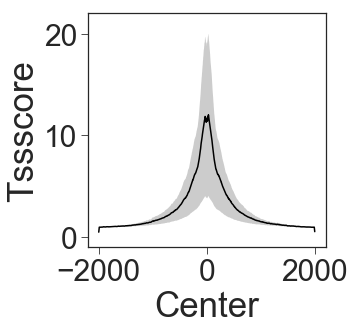

In [930]:
fig2,ax2=get_Fig_ax('center','TSSscore')
DrawQC(fig2,ax2,Xs_Arm,[Ys_Arm[i]+Ys_Back[i]+Ys_Norm[i] for i in range(len(Ys_Arm))],'k')
fig2.savefig(os.path.join(TSSDir, 'TSSscore.AllState.pdf'))
plt.show()




# Normalization

In [15]:
def NormLog(DF,label,method,O,outDir):
    def log(L):return np.array([math.log(i+1,2) for i in L])
    if method=='QNorm':
        print 'Do QNorm...'
        rank_mean=DF.stack().groupby(DF.rank(method='first').stack().astype(int)).mean()
        DF=DF.rank(method='min').stack().astype(int).map(rank_mean).unstack()
        print 'QNorm Done!'
    if method=='DEseq':
        print 'Do DEseq...'
        SizeFactor=(DF.T/DF.apply(gmean,axis=1)).dropna(axis=1,how='any').apply(np.median,axis=1)
        DF=DF/SizeFactor
        outSizeFactor=os.path.join(outDir,'DEseq_sizeFactors.txt')
        SizeFactor.to_csv(outSizeFactor,sep='\t')
        print 'DEseq Done!'
    DFlog=DF.apply(log)
    if O:
        print 'Output file...'
        outfilelog=os.path.join(outDir,'PeakCount.'+label+'_'+method+'_Normalized.log2.txt')
        outfile=os.path.join(outDir,'PeakCount.'+label+'_'+method+'_Normalized.txt')
        DF.to_csv(outfile,sep='\t')
        DFlog.to_csv(outfilelog,sep='\t')
    return DF,DFlog


In [16]:
NormDF=Read(NormF)
NormDF_Norm,NormDF_Normlog=NormLog(NormDF,'NormSkin','QNorm',True,outDirNorm)


Do QNorm...
QNorm Done!
Output file...


In [17]:
AllDF=Read(AllF)
AllDF_Norm,AllDF_Normlog=NormLog(AllDF,'AllSampleSkin','QNorm',True,outDirAll)


Do QNorm...
QNorm Done!
Output file...


# Sample ColorAnnotation

In [18]:

AllSampleColorDF=pd.DataFrame({'Celltype':[ClusterColorsDict[i.split('_')[0]] for i in list(AllDF)]}, index=list(AllDF))              
AllSampleColorDF['State']=[StateColorDict[GetState(i)] for i in AllSampleColorDF.index]



# Annotation Peaks

In [19]:
NormAnoF=os.path.join(outDirNorm,'NormPeaks.ano.txt')
Comd='annotatePeaks.pl {} hg19 > {}'.format(NormBed,NormAnoF)
os.system(Comd)


0

In [20]:
AllAnoF=os.path.join(outDirAll,'AllSamplesPeaks.ano.txt')
Comd='annotatePeaks.pl {} hg19 > {}'.format(AllBed,AllAnoF)
os.system(Comd)



0

### Correlation Annalysis

In [21]:
NormAnoDF=ReadTable(NormAnoF)
AllAnoDF=ReadTable(AllAnoF)


In [30]:
DirNorm=os.path.join(outDirNorm,'SampleCorrelation')
DirAll=os.path.join(outDirAll,'SampleCorrelation')
Mkdir(DirNorm)
Mkdir(DirAll)


In [31]:
NormDF_Norm_Distal=NormDF_Norm.loc[NormAnoDF[abs(NormAnoDF['Distance to TSS'])>1000].index]
AllDF_Norm_Distal=AllDF_Norm.loc[AllAnoDF[abs(AllAnoDF['Distance to TSS'])>1000].index]


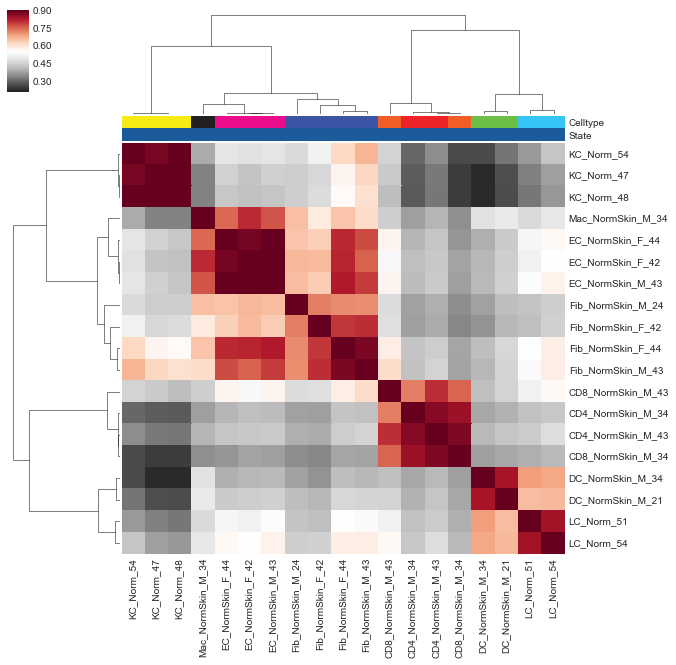

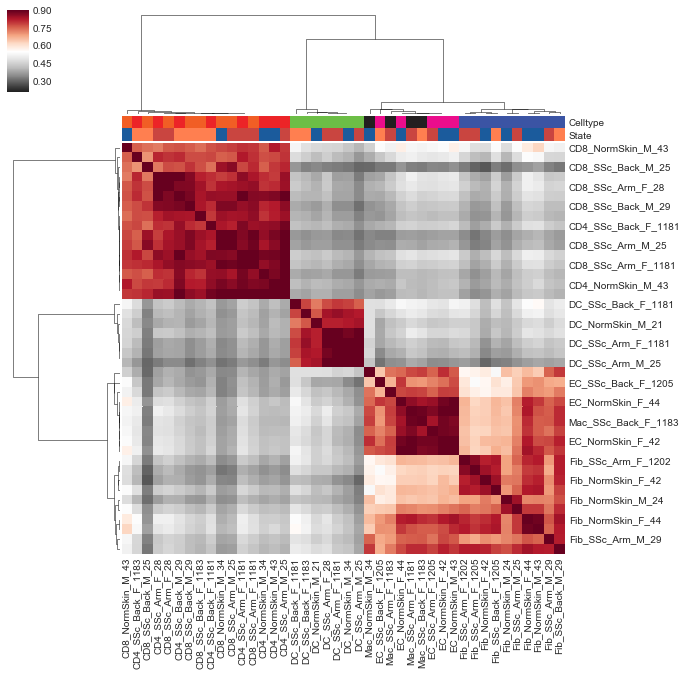

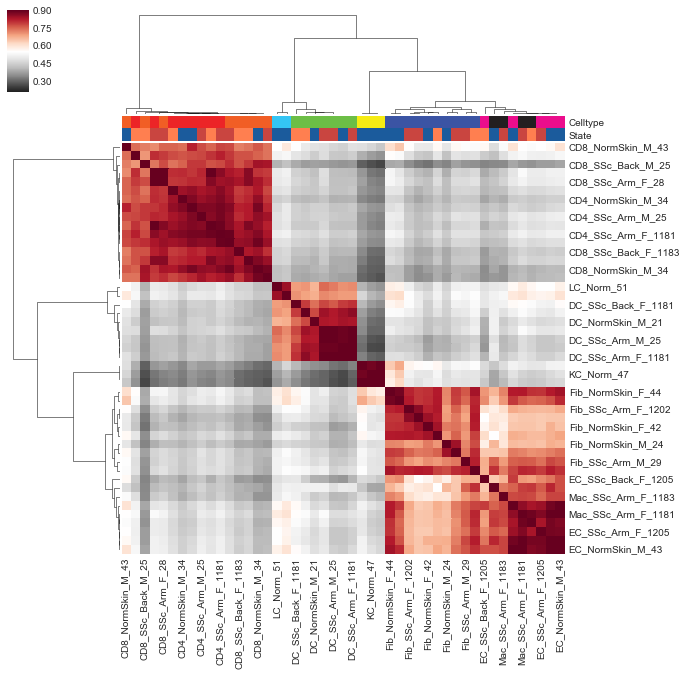

In [32]:

CorDF=NormDF_Norm_Distal.corr(method='pearson')
sns.clustermap(CorDF,cmap='RdGy_r',method='average', metric='correlation',vmax=0.9,vmin=0.2, col_colors=AllSampleColorDF)                 
plt.savefig(os.path.join(DirNorm,"DistalPeaks_NormSample_Correlation.pdf"))
plt.show()
Save(CorDF, os.path.join(DirNorm,'DistalPeaks_NormSample_PearsonCorrelation.txt'))

AllCorDF=AllDF_Norm_Distal.corr(method='pearson')
sns.clustermap(AllCorDF,cmap='RdGy_r',method='average', metric='correlation',vmax=0.9,vmin=0.2, col_colors=AllSampleColorDF)                 
plt.savefig(os.path.join(DirAll,"DistalPeaks_AllSample_Correlation.pdf"))
plt.show()
Save(CorDF, os.path.join(DirAll,'DistalPeaks_AllSample_PearsonCorrelation.txt'))



# PCA Analysis 

In [34]:
DirNorm=os.path.join(outDirNorm,'SamplePCA')
DirAll=os.path.join(outDirAll,'SamplePCA')
Mkdir(DirNorm)
Mkdir(DirAll)


In [61]:
def Pca(inDFP,outfigPrex,labelDF=None,colorhue='Celltype',colorDict=ClusterColorsDict,markerhue='State',markerDict=ClusterMarkerDict):                
    print 'PCA!'
    pca=PCA(n_components=3)
    pca.fit(inDFP)
    pca_ratio=pca.explained_variance_ratio_
    newDatal=pd.DataFrame(np.transpose(pca.components_),index=inDFP.columns)
    labelDF=labelDF.loc[newDatal.index]          
    newDatal['Color']=labelDF[colorhue]
    if markerhue:
        newDatal['Marker']=labelDF[markerhue]
    
    def pca_2D(a,b,Txt):
        print '2D:'+str(a)+str(b)
        plt.style.use('seaborn-white')
        fig1=plt.figure(figsize=(6,6))
        ax1=fig1.add_axes([0.2,0.2,0.7,0.7])
        ax1.set_xlabel('PC{}({:.2f}%)'.format(a,pca_ratio[a-1]*100),fontsize=25)
        ax1.set_ylabel('PC{}({:.2f}%)'.format(b,pca_ratio[b-1]*100),fontsize=25)
        ax1.tick_params(axis='both',length=7,labelsize=25,direction='out')
        for i in newDatal.groupby(newDatal['Color']):
            subDF=i[1]
            cl=list(subDF['Color'])[0]
            C=colorDict[cl]
            if markerhue:
                for j in subDF.groupby(subDF['Marker']):
                    
                    ssubDF=j[1]
                    
                    #ml=ssubDF['Marker'][1]
                    ml=j[0]
                    M=markerDict[ml]
                    ax1.scatter(ssubDF[a-1],ssubDF[b-1],s=100,c=C,marker=M,alpha=0.75,edgecolors='none',label=cl+'-'+ml)
            else:
                M='o'
                ax1.scatter(subDF[a-1],subDF[b-1],s=100,c=C,marker=M,alpha=0.75,edgecolors='none',label=cl)
        ax1.legend(fontsize=10,markerscale=1,ncol=1,edgecolor='k',columnspacing=0,labelspacing=0,handletextpad=0)    
        ax1.tick_params(axis='both',length=7,labelsize=25,direction='out')
        if Txt:
            outfig='{}.2D.{}-{}.Txt.pdf'.format(outfigPrex,str(a),str(b))
            for i in newDatal.index:
                ax1.text(newDatal[a-1][i],newDatal[b-1][i],i.split('T')[0],fontsize=5)
            plt.savefig(outfig)
        else:
            outfig='{}.2D.{}-{}.pdf'.format(outfigPrex,str(a),str(b))    
            plt.savefig(outfig)            

    pca_2D(1,2,True)
    pca_2D(1,3,True)
    pca_2D(2,3,True)
    pca_2D(1,2,False)
    pca_2D(1,3,False)
    pca_2D(2,3,False)
    plt.show()
    
    def pca_3D(a,b,c,Txt):
        print 'pca_3D'+str(a)+str(b)+str(c)
        ax1=plt.subplot(111,projection='3d')
        ax1.set_xlabel('PC{}({:.2f}%)'.format(a,pca_ratio[a-1]*100),fontsize=20)
        ax1.set_ylabel('PC{}({:.2f}%)'.format(b,pca_ratio[b-1]*100),fontsize=20)
        ax1.set_zlabel('PC{}({:.2f}%)'.format(c,pca_ratio[c-1]*100),fontsize=20)  
                       
        for i in newDatal.groupby(newDatal['Color']):
            subDF=i[1]
            #print subDF['Color']
            #print list(subDF['Color'].values)
            cl=list(subDF['Color'].values)[0]
            C=colorDict[cl]
            if markerhue:
                for j in subDF.groupby(subDF['Marker']):
                    ssubDF=j[1]
                    #ml=ssubDF['Marker'][1]
                    ml=j[0]
                    M=markerDict[ml]
                    ax1.scatter(ssubDF[a-1],ssubDF[b-1],ssubDF[c-1],s=50,c=C,marker=M,alpha=0.75,edgecolors='none',label=cl+'-'+ml)
            else:
                M='o'
                ax1.scatter(subDF[a-1],subDF[b-1],subDF[c-1],s=50,c=C,marker=M,alpha=0.75,edgecolors='none',label=cl)
        ax1.legend(fontsize=10,markerscale=1,ncol=1,edgecolor='k',columnspacing=0,labelspacing=0,handletextpad=0)    
        ax1.tick_params(axis='both',length=12,labelsize=20,direction='out') 
        
        if Txt:
            outfig='{}.3D.{}-{}-{}.Txt.pdf'.format(outfigPrex,str(a),str(b),str(c))
            for i in newDatal.index:
                ax1.text(newDatal[a-1][i],newDatal[b-1][i],newDatal[c-1][i],i.split('T')[0],fontsize=5)
            plt.savefig(outfig)
        else:
            outfig='{}.3D.{}-{}-{}.pdf'.format(outfigPrex,str(a),str(b),str(c))    
            plt.savefig(outfig)     
        plt.show()
        print outfig
        return 
    
    print 'Txt True'
    pca_3D(1,2,3,True)
    pca_3D(1,3,2,True)
    pca_3D(2,1,3,True)
    pca_3D(2,3,1,True)
    pca_3D(3,1,2,True)
    pca_3D(3,2,1,True)

    print 'Txt False'
    pca_3D(1,2,3,False)
    pca_3D(1,3,2,False)
    pca_3D(2,1,3,False)
    pca_3D(2,3,1,False)
    pca_3D(3,1,2,False)
    pca_3D(3,2,1,False)
    
            
            
            

In [62]:
LabelDF=pd.DataFrame({'Celltype':[i.split('_')[0] for i in list(AllDF)]}, index=list(AllDF)) 
LabelDF['State']=[GetState(i) for i in LabelDF.index]


PCA!
2D:12
2D:13
2D:23
2D:12
2D:13
2D:23


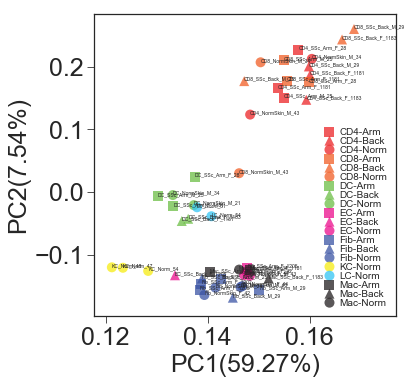

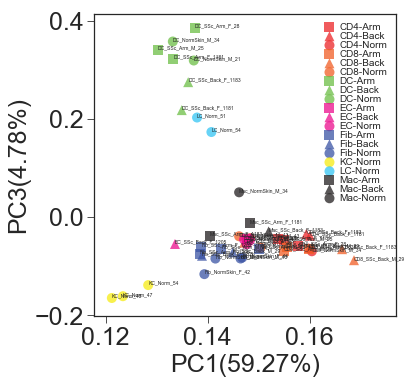

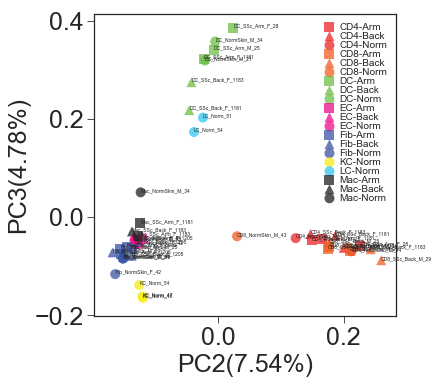

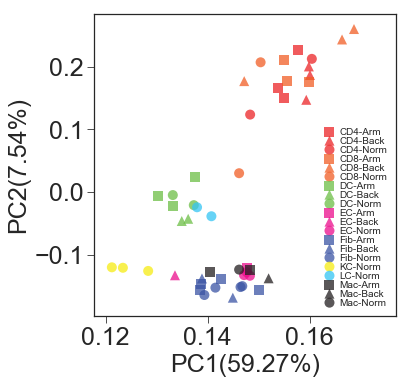

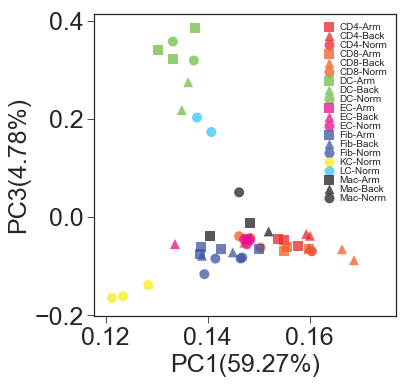

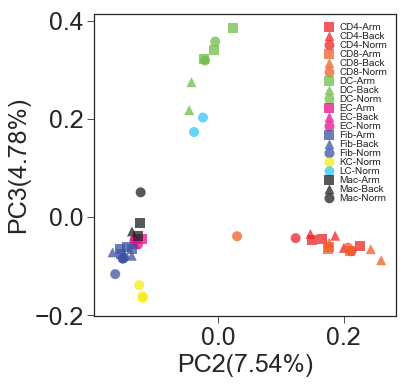

Txt True
pca_3D123


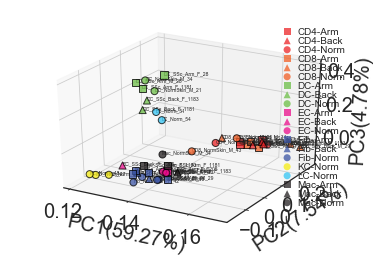

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.1-2-3.Txt.pdf
pca_3D132


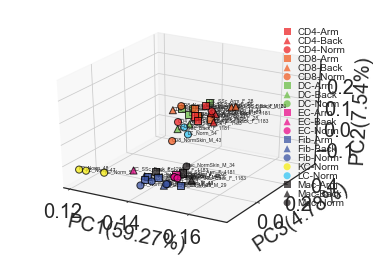

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.1-3-2.Txt.pdf
pca_3D213


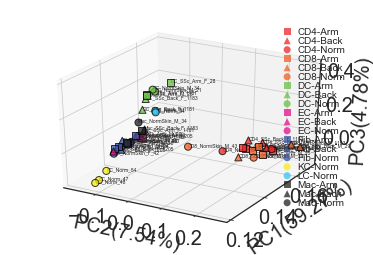

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.2-1-3.Txt.pdf
pca_3D231


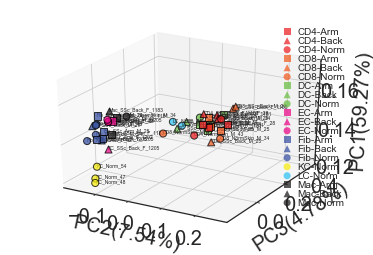

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.2-3-1.Txt.pdf
pca_3D312


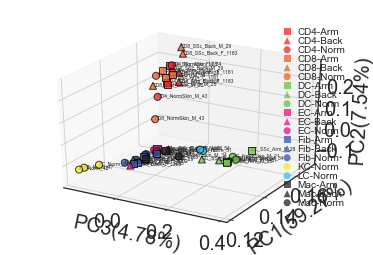

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.3-1-2.Txt.pdf
pca_3D321


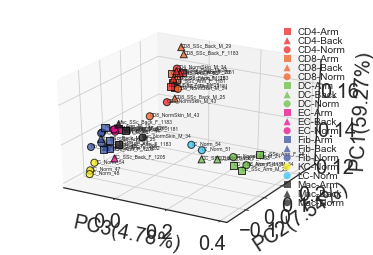

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.3-2-1.Txt.pdf
Txt False
pca_3D123


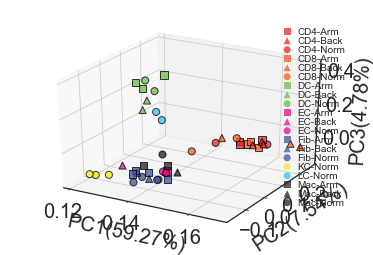

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.1-2-3.pdf
pca_3D132


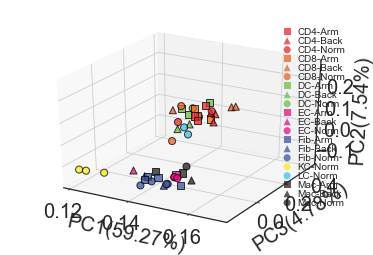

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.1-3-2.pdf
pca_3D213


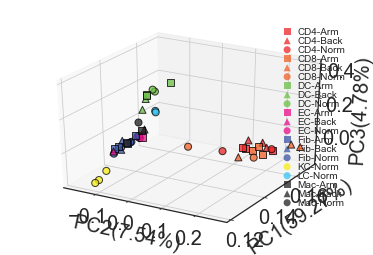

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.2-1-3.pdf
pca_3D231


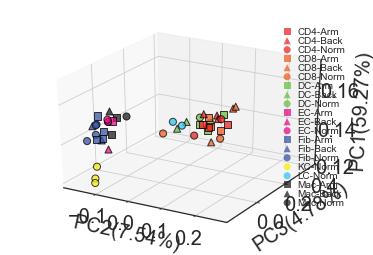

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.2-3-1.pdf
pca_3D312


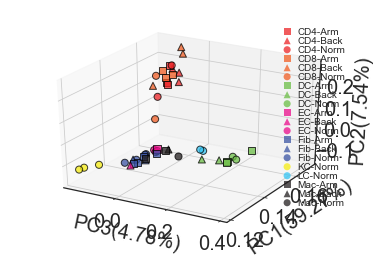

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.3-1-2.pdf
pca_3D321


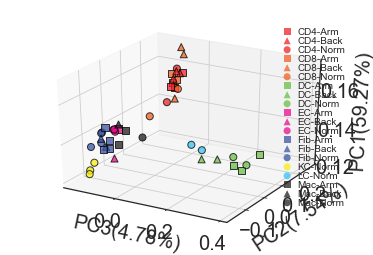

/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SamplePCA/AllPeaks_log2_PCA.3D.3-2-1.pdf


In [70]:
Pca(AllDF_Normlog,os.path.join(DirAll,'AllPeaks_log2_PCA'),labelDF=LabelDF,colorhue='Celltype',colorDict=ClusterColorsDict,markerhue='State',markerDict=ClusterMarkerDict)




# Celltype specific Peaks

In [22]:

DirNorm=os.path.join(outDirNorm,'SampleCelltypeSpecific')
DirAllCommon=os.path.join(outDirAllCommon,'SampleCelltypeSpecific')
DirAll=os.path.join(outDirAll,'SampleCelltypeSpecific')
Mkdir(DirNorm)
Mkdir(DirAllCommon)
Mkdir(DirAll)



In [12]:

#Celltype specific peaks selection
def CellTypeSpecificPeaks(DF,label,Bed,Order,outDir,ColorDF,cmap='YlGnBu',incov=0.5,outcov=0.5,f=1.5,p=0.01,DoNorm=True):
    Dir=os.path.join(outDir,'SpecificPeaks.incov_{}.outcov_{}.f_{}.p_{}'.format(incov,outcov,f,p))
    Mkdir(Dir)
    SampleUsed=[i for i in list(DF) if i.split('_')[0] in Order]
    DF=DF[SampleUsed]
    if DoNorm:
        NormDF,NormDFLog=NormLog(DF,label,'QNorm',True,outDir)
    else:
        NormDFLog=DF
    NormDFLog=NormDFLog[NormDFLog.apply(max,axis=1)>4]
    PEAK=[]
    SAMPLE=[]
    CellTypeSpecificPeaks_Dict={}
    for ct in Order:
        print ct
        CT=ct.split('-')
        IN=NormDFLog[[i for i in list(NormDFLog) if i.split('_')[0] in CT]]
        if len(CT)==1:
            SAMPLE=SAMPLE+list(IN)
        OUT=NormDFLog[[i for i in list(NormDFLog) if i.split('_')[0] not in CT]]
        outCOV=OUT.apply(scipy.stats.variation,axis=1)
        M=IN.apply(np.mean,axis=1)
        F=M-OUT.apply(np.mean,axis=1)
        
#        if ct=='Mac':
#            continue
            
        if len(list(IN))>1:
            inCOV=IN.apply(scipy.stats.variation,axis=1)
            P=pd.Series(scipy.stats.ttest_ind(IN,OUT,axis=1)[1],index=IN.index)
            Peaks=list(M[(inCOV<incov)&(outCOV<outcov)&(F>f)&(P<p)].sort_values().index)
        elif len(list(IN))==1:
            continue
            #Peaks=list(M[(outCOV<outcov)&(F>3)].sort_values().index)
        Data=NormDFLog.loc[Peaks]
        bed=Bed.loc[Peaks]
        Save(Data,os.path.join(Dir,ct+'.specific.Peaks.QNorm.log.txt'))
        SaveBed(bed,os.path.join(Dir,ct+'.specific.Peaks.QNorm.log.bed'))
        Peaks=[i for i in Peaks if i not in PEAK]
        print len(Peaks)
        CellTypeSpecificPeaks_Dict[ct]=Peaks
        PEAK=PEAK+Peaks
        
    DATA=NormDFLog[SAMPLE].loc[PEAK]
    BED=Bed.loc[PEAK]
    Save(DATA,os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.txt'))
    SaveBed(BED,os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.bed'))
    #ColorDF=pd.DataFrame({'CellType':[ClusterColorsDict[i.split('_')[0]] for i in SAMPLE]},index=SAMPLE)
    print 'Draw Figure ...'
    DATA.index=[' ']*len(DATA)
    fig=sns.clustermap(DATA,figsize=(6,6),row_cluster=False,col_cluster=False,cmap=cmap,vmin=2,vmax=8,xticklabels=[i.split('_')[0] for i in SAMPLE],col_colors=ColorDF)
    print 'Save Figure ...'
    fig.savefig(os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.pdf'))
    print os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.pdf')
    plt.show()
    print 'Done!'   
    
    fig=sns.clustermap(DATA.apply(scipy.stats.zscore,axis=1),figsize=(6,6),row_cluster=False,col_cluster=False,cmap=cmap,vmin=-2,vmax=2,xticklabels=[i.split('_')[0] for i in SAMPLE],col_colors=ColorDF)
    print 'Save Figure ...'
    fig.savefig(os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.Zscore.pdf'))
    plt.show()
    return CellTypeSpecificPeaks_Dict



Do QNorm...
QNorm Done!
Output file...
CD4


/Users/liuqian/anaconda2/lib/python2.7/site-packages/scipy/stats/stats.py:977: RuntimeWarning: invalid value encountered in double_scalars
  return a.std(axis) / a.mean(axis)


2646
CD4-CD8
2577
CD8
247
DC
3243
DC-LC
563
LC
193
Mac
287
EC
640
Fib
1547
KC
1891
Draw Figure ...
Save Figure ...
/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SampleCelltypeSpecific/SpecificPeaks.incov_0.5.outcov_0.5.f_1.5.p_0.005/Celltype.specific.Peaks.QNorm.log.pdf


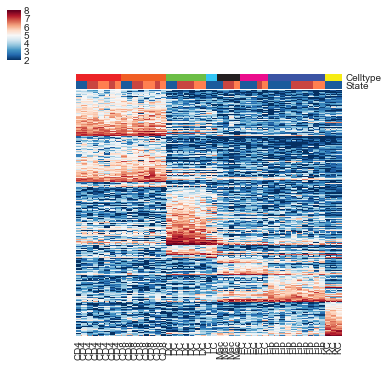

Done!
Save Figure ...


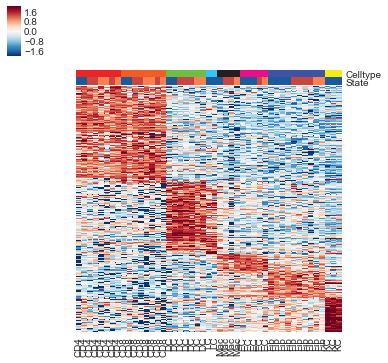

In [84]:

#AllSamples
AllBedDF=ReadBed(AllBed)
AllOrder=['CD4','CD4-CD8','CD8','DC','DC-LC','LC','Mac','EC','Fib','KC']
AllCellTypeSpecificPeaks_Dict=CellTypeSpecificPeaks(AllDF,'AllSamples',AllBedDF,AllOrder,DirAll,AllSampleColorDF,cmap='RdBu_r',incov=0.5,outcov=0.5,f=1.5,p=0.005,DoNorm=True)    



In [23]:
#AllSamples
#Celltype specific peaks selection
def CellTypeSpecificPeaks_WithoutMac(DF,label,Bed,Order,outDir,ColorDF,cmap='YlGnBu',incov=0.5,outcov=0.5,f=1.5,p=0.01,DoNorm=True):
    Dir=os.path.join(outDir,'SpecificPeaks.incov_{}.outcov_{}.f_{}.p_{}'.format(incov,outcov,f,p))
    Mkdir(Dir)
    #Specific Peaks for Other celltypes
    SampleUsed=[i for i in list(DF) if i.split('_')[0] in [x for x in Order if x!='Mac']]
    NormDF,NormDFLog=NormLog(DF[SampleUsed],label,'QNorm',True,outDir)
    NormDFLog=NormDFLog[NormDFLog.apply(max,axis=1)>4]
    PEAK=[]
    SAMPLE=[]
    CellTypeSpecificPeaks_Dict={}
    for ct in Order:
        print ct
        CT=ct.split('-')
        if len(CT)==1:
            SAMPLE=SAMPLE+list([i for i in list(DF) if i.split('_')[0] in CT])
        if ct!='Mac':
            IN=NormDFLog[[i for i in list(NormDFLog) if i.split('_')[0] in CT]]
            OUT=NormDFLog[[i for i in list(NormDFLog) if i.split('_')[0] not in CT]]
            outCOV=OUT.apply(scipy.stats.variation,axis=1)
            M=IN.apply(np.mean,axis=1)
            F=M-OUT.apply(np.mean,axis=1)
            if len(list(IN))>1:
                inCOV=IN.apply(scipy.stats.variation,axis=1)
                P=pd.Series(scipy.stats.ttest_ind(IN,OUT,axis=1)[1],index=IN.index)
                Peaks=list(M[(inCOV<incov)&(outCOV<outcov)&(F>f)&(P<p)].sort_values().index)
            elif len(list(IN))==1:
                continue
            Data=NormDFLog.loc[Peaks]
            bed=Bed.loc[Peaks]
            Save(Data,os.path.join(Dir,ct+'.specific.Peaks.QNorm.log.txt'))
            SaveBed(bed,os.path.join(Dir,ct+'.specific.Peaks.QNorm.log.bed'))
            Peaks=[i for i in Peaks if i not in PEAK]
            print len(Peaks)
            CellTypeSpecificPeaks_Dict[ct]=Peaks
            PEAK=PEAK+Peaks
            
    print SAMPLE
    NormDF,NormDFLog=NormLog(DF,label,'QNorm',True,outDir)
    DATA=NormDFLog[SAMPLE].loc[PEAK]
    BED=Bed.loc[PEAK]
    Save(DATA,os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.txt'))
    SaveBed(BED,os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.bed'))
    #ColorDF=pd.DataFrame({'CellType':[ClusterColorsDict[i.split('_')[0]] for i in SAMPLE]},index=SAMPLE)
    print 'Draw Figure ...'
    DATA.index=[' ']*len(DATA)
    fig=sns.clustermap(DATA,figsize=(6,6),row_cluster=False,col_cluster=False,cmap=cmap,vmin=2,vmax=8,xticklabels=[i.split('_')[0] for i in SAMPLE],col_colors=ColorDF)
    print 'Save Figure ...'
    fig.savefig(os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.pdf'))
    print os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.pdf')
    plt.show()
    print 'Done!'   
    
    fig=sns.clustermap(DATA.apply(scipy.stats.zscore,axis=1),figsize=(6,6),row_cluster=False,col_cluster=False,cmap=cmap,vmin=-2,vmax=2,xticklabels=[i.split('_')[0] for i in SAMPLE],col_colors=ColorDF)
    print 'Save Figure ...'
    fig.savefig(os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.Zscore.pdf'))
    plt.show()
    return CellTypeSpecificPeaks_Dict


In [24]:


DirAll2=os.path.join(outDirAll,'SampleCelltypeSpecific_WithoutMac')
Mkdir(DirAll2)
AllBedDF=ReadBed(AllBed)
AllOrder=['CD4','CD4-CD8','CD8','DC','DC-LC','LC','Mac','EC','Fib','KC']
AllCellTypeSpecificPeaks_Dict=CellTypeSpecificPeaks_WithoutMac(AllDF,'AllSamples',AllBedDF,AllOrder,DirAll2,AllSampleColorDF,cmap='RdBu_r',incov=0.5,outcov=0.5,f=1.5,p=0.005,DoNorm=True)    





Do QNorm...


KeyboardInterrupt: 

In [25]:
#AllSamples
#Celltype specific peaks selection
def CellTypeSpecificPeaks_WithoutMac_AddMacSpecific(DF,label,Bed,Order,outDir,ColorDF,cmap='YlGnBu',incov=0.5,outcov=0.5,f=1.5,p=0.01,DoNorm=True):
    Dir=os.path.join(outDir,'SpecificPeaks.incov_{}.outcov_{}.f_{}.p_{}'.format(incov,outcov,f,p))
    Mkdir(Dir)
    
    def CellTypeSpecific(NormDFLog, CT,CellTypeSpecificPeaks_Dict,PEAK,Dir,ct):
        IN=NormDFLog[[i for i in list(NormDFLog) if i.split('_')[0] in CT]]
        OUT=NormDFLog[[i for i in list(NormDFLog) if i.split('_')[0] not in CT]]
        outCOV=OUT.apply(scipy.stats.variation,axis=1)
        M=IN.apply(np.mean,axis=1)
        F=M-OUT.apply(np.mean,axis=1)
        if len(list(IN))>1:
            inCOV=IN.apply(scipy.stats.variation,axis=1)
            P=pd.Series(scipy.stats.ttest_ind(IN,OUT,axis=1)[1],index=IN.index)
            Peaks=list(M[(inCOV<incov)&(outCOV<outcov)&(F>f)&(P<p)].sort_values().index)
        elif len(list(IN))==1:
            return []
        Data=NormDFLog.loc[Peaks]
        bed=Bed.loc[Peaks]
        Save(Data,os.path.join(Dir,ct+'.specific.Peaks.QNorm.log.txt'))
        SaveBed(bed,os.path.join(Dir,ct+'.specific.Peaks.QNorm.log.bed'))
        Peaks=[i for i in Peaks if i not in PEAK]
        print len(Peaks)
        CellTypeSpecificPeaks_Dict[ct]=Peaks
        return Peaks
    
    #Specific Peaks for Other celltypes
    SampleUsed=[i for i in list(DF) if i.split('_')[0] in [x for x in Order if x!='Mac']]
    NormDF,NormDFLog=NormLog(DF[SampleUsed],label,'QNorm',True,outDir)
    NormDFLog=NormDFLog[NormDFLog.apply(max,axis=1)>4]
    PEAK=[]
    SAMPLE=[]
    CellTypeSpecificPeaks_Dict={}
    for ct in Order:
        print ct
        CT=ct.split('-')
        if len(CT)==1:
            SAMPLE=SAMPLE+list([i for i in list(DF) if i.split('_')[0] in CT])
        if ct!='Mac':
            Peaks=CellTypeSpecific(NormDFLog, CT,CellTypeSpecificPeaks_Dict,PEAK,Dir,ct)
        if ct=='Mac':
            _,NormDFLogAll=NormLog(DF,label,'QNorm',True,outDir)
            Peaks=CellTypeSpecific(NormDFLogAll, CT,CellTypeSpecificPeaks_Dict,PEAK,Dir,ct)
        PEAK=PEAK+Peaks
            
    print SAMPLE
    NormDF,NormDFLog=NormLog(DF,label,'QNorm',True,outDir)
    DATA=NormDFLog[SAMPLE].loc[PEAK]
    BED=Bed.loc[PEAK]
    Save(DATA,os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.txt'))
    SaveBed(BED,os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.bed'))
    #ColorDF=pd.DataFrame({'CellType':[ClusterColorsDict[i.split('_')[0]] for i in SAMPLE]},index=SAMPLE)
    print 'Draw Figure ...'
    DATA.index=[' ']*len(DATA)
    fig=sns.clustermap(DATA,figsize=(6,6),row_cluster=False,col_cluster=False,cmap=cmap,vmin=2,vmax=8,xticklabels=[i.split('_')[0] for i in SAMPLE],col_colors=ColorDF)
    print 'Save Figure ...'
    fig.savefig(os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.pdf'))
    print os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.pdf')
    plt.show()
    print 'Done!'   
    
    fig=sns.clustermap(DATA.apply(scipy.stats.zscore,axis=1),figsize=(6,6),row_cluster=False,col_cluster=False,cmap=cmap,vmin=-2,vmax=2,xticklabels=[i.split('_')[0] for i in SAMPLE],col_colors=ColorDF)
    print 'Save Figure ...'
    fig.savefig(os.path.join(Dir,'Celltype.specific.Peaks.QNorm.log.Zscore.pdf'))
    plt.show()
    return CellTypeSpecificPeaks_Dict



Do QNorm...
QNorm Done!
Output file...
CD4


/Users/liuqian/anaconda2/lib/python2.7/site-packages/scipy/stats/stats.py:977: RuntimeWarning: invalid value encountered in double_scalars
  return a.std(axis) / a.mean(axis)


2597
CD4-CD8
2939
CD8
259
DC
3183
DC-LC
589
LC
182
Mac
Do QNorm...
QNorm Done!
Output file...
284
EC
941
Fib
1583
KC
1884
['CD4_NormSkin_M_34', 'CD4_NormSkin_M_43', 'CD4_SSc_Arm_F_1181', 'CD4_SSc_Arm_M_25', 'CD4_SSc_Back_F_1181', 'CD4_SSc_Back_F_1183', 'CD4_SSc_Arm_F_28', 'CD4_SSc_Back_M_29', 'CD8_NormSkin_M_34', 'CD8_NormSkin_M_43', 'CD8_SSc_Arm_F_1181', 'CD8_SSc_Arm_M_25', 'CD8_SSc_Back_F_1183', 'CD8_SSc_Back_M_25', 'CD8_SSc_Arm_F_28', 'CD8_SSc_Back_M_29', 'DC_NormSkin_M_21', 'DC_NormSkin_M_34', 'DC_SSc_Arm_F_1181', 'DC_SSc_Arm_F_28', 'DC_SSc_Arm_M_25', 'DC_SSc_Back_F_1181', 'DC_SSc_Back_F_1183', 'LC_Norm_51', 'LC_Norm_54', 'Mac_NormSkin_M_34', 'Mac_SSc_Arm_F_1181', 'Mac_SSc_Arm_F_1183', 'Mac_SSc_Back_F_1183', 'EC_NormSkin_F_42', 'EC_NormSkin_F_44', 'EC_NormSkin_M_43', 'EC_SSc_Arm_F_1205', 'EC_SSc_Back_F_1205', 'Fib_NormSkin_F_42', 'Fib_NormSkin_F_44', 'Fib_NormSkin_M_24', 'Fib_NormSkin_M_43', 'Fib_SSc_Arm_F_1202', 'Fib_SSc_Arm_F_1205', 'Fib_SSc_Arm_M_25', 'Fib_SSc_Arm_M_29', 'Fib_SS

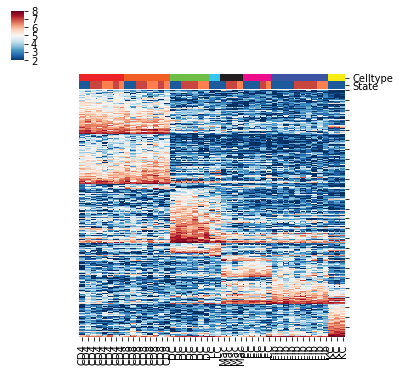

Done!
Save Figure ...


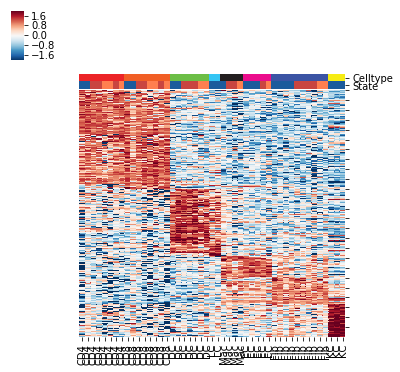

In [26]:

DirAll3=os.path.join(outDirAll,'SampleCelltypeSpecific_WithoutMac_AddMacSpecific')
Mkdir(DirAll3)
AllBedDF=ReadBed(AllBed)
AllOrder=['CD4','CD4-CD8','CD8','DC','DC-LC','LC','Mac','EC','Fib','KC']
AllCellTypeSpecificPeaks_Dict=CellTypeSpecificPeaks_WithoutMac_AddMacSpecific(AllDF,'AllSamples',AllBedDF,AllOrder,DirAll3,AllSampleColorDF,cmap='RdBu_r',incov=0.5,outcov=0.5,f=1.5,p=0.005,DoNorm=True)    




In [29]:
outDirAll

'/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac'

# Ano Bed

In [32]:
#Input Dirs

def AnoBed(Dir):
    BedFiles=[i for i in os.listdir(Dir) if i[-3:]=='bed']
    for f in BedFiles:
        print f
        F=os.path.join(Dir,f)
        comd='/seq/homer/bin/annotatePeaks.pl {} hg19 > {}.ano.txt'.format(F,F)
        os.system(comd)
    
    

In [34]:
AnoBed('/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SampleCelltypeSpecific_WithoutMac_AddMacSpecific/SpecificPeaks.incov_0.5.outcov_0.5.f_1.5.p_0.005')                           


CD4-CD8.specific.Peaks.QNorm.log.bed
CD4.specific.Peaks.QNorm.log.bed
CD8.specific.Peaks.QNorm.log.bed
Celltype.specific.Peaks.QNorm.log.bed
DC-LC.specific.Peaks.QNorm.log.bed
DC.specific.Peaks.QNorm.log.bed
EC.specific.Peaks.QNorm.log.bed
Fib.specific.Peaks.QNorm.log.bed
KC.specific.Peaks.QNorm.log.bed
LC.specific.Peaks.QNorm.log.bed
Mac.specific.Peaks.QNorm.log.bed


# Genomica TF Enrichment 

In [23]:
#Input gxr file
#NormGxrDir='/Users/liuqian/Documents/A_SSC_project/A_Code_available/Norm/SampleCelltypeSpecific/SpecificPeaks.incov_0.5.outcov_0.5.f_2.p_0.005/Genomica'                           
#AllCommonGxrDir='/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_NormSScCommon/Add_Macrophage/SampleCelltypeSpecific/SpecificPeaks.incov_0.5.outcov_0.5.f_1.5.p_0.005/Genomica'                                                       
AllGxrDir='/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SampleCelltypeSpecific_WithoutMac/SpecificPeaks.incov_0.5.outcov_0.5.f_1.5.p_0.005/Genomica'                   




In [31]:

def Range(L):return max(L)-min(L)
def Genomic_Display(GxrFile,Dir,colormap='RdBu_r',LabelDF=None,vmax=50,colorLabel=['CelltypeColor'],topNum=100):
    GXR=Read(GxrFile)
    F1=((abs(GXR)>0).apply(sum,axis=1))>len(list(GXR))*0.1  #只保留那些至少在十分之一的样本中存在富集指数的TF
    GXR=GXR[F1]
    Index=GXR.apply(Range,axis=1).sort_values()[-topNum:].index
    GXR=GXR.loc[Index]
    Motif=[i.split('(')[0].upper() for i in Index]
    GXR.index=Motif
    GXR=GXR[~GXR.index.duplicated(keep='first')]
    GXR.to_csv(os.path.join(Dir,'GenomicMotifEnrichment.topNum{}.Heatmap.txt'.format(str(topNum))),sep='\t')
    fig=sns.clustermap(GXR,figsize=(0.3*len(list(GXR)),0.25*len(GXR)),center=0,vmin=-vmax,vmax=vmax,col_cluster=True,row_cluster=True,col_colors=LabelDF[colorLabel],cmap=colormap,method='average',metric='correlation')                    
    TFOrder=GXR.index[fig.dendrogram_row.reordered_ind]
    SamplesOrder=GXR.columns[fig.dendrogram_col.reordered_ind]
    
    plt.setp(fig.ax_heatmap.get_yticklabels(), rotation=0,fontsize=10)
    plt.setp(fig.ax_heatmap.get_xticklabels(), rotation=90,fontsize=10)
    fig.savefig(os.path.join(Dir,'GenomicMotifEnrichment.topNum{}.Heatmap.pdf'.format(str(topNum))))
    
    
    oGXR=GXR.loc[TFOrder][SamplesOrder]
    
    y=[0.5+i for i in range(len(oGXR))]
    x=[0.5+i for i in range(len(list(oGXR)))]
    Ylim=[0,y[-1]+0.5]
    Xlim=[0,x[-1]+0.5]
    X=[]
    Y=[]
    C=[]
    Header=list(oGXR)
    for i in range(len(list(oGXR))):
        Col=Header[i]
        C=C+list(oGXR[Col])
        X=X+[0.5+i]*len(oGXR)
        Y=Y+y

    plt.style.use('seaborn-white')
    fig=plt.figure(figsize=(0.35*len(list(oGXR)),0.28*len(oGXR)))
    ax=fig.add_axes([0.15,0.05,0.8,0.9])
    ax.set_xlim(Xlim)
    ax.set_ylim(Ylim)
    ax.set_xticks(x)
    ax.set_yticks(y)
    ax.set_xticklabels(list(oGXR),rotation='vertical')
    ax.set_yticklabels(list(oGXR.index))
    ax.scatter(X,Y,c=C,cmap='coolwarm',s=300,vmax=vmax,vmin=-vmax)
    ax.tick_params(axis='y',length=7,labelsize=15,direction='out')
    ax.tick_params(axis='x',length=7,labelsize=15,direction='out')
   
    fig.savefig(os.path.join(Dir,'GenomicMotifEnrichment.topNum{}.Scatterplot.pdf'.format(str(topNum))))
    plt.show()
    return oGXR



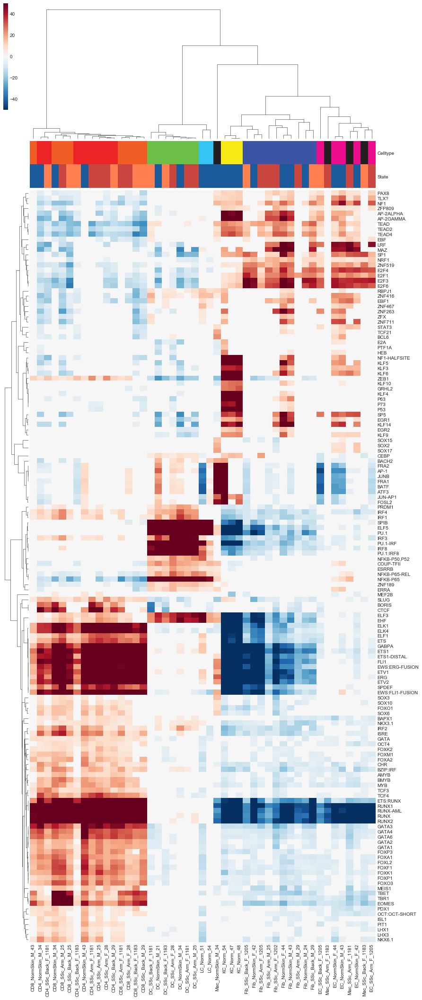

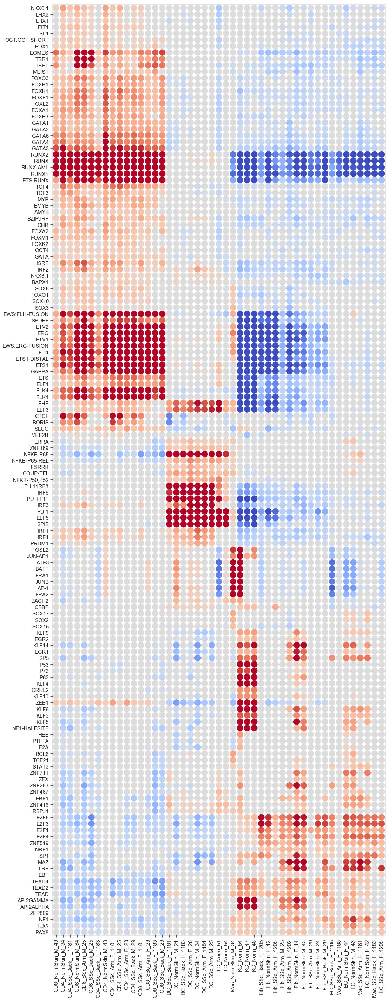

In [35]:
AllTFDF=Genomic_Display(os.path.join(AllGxrDir,'SpecificPeaks.10_5000_1.gxr.txt'),AllGxrDir,colormap='RdBu_r',LabelDF=AllSampleColorDF,vmax=50,colorLabel=['Celltype','State'],topNum=150)                           



In [ ]:
#NormTFDF=Genomic_Display(os.path.join(NormGxrDir,'SpecificPeaks.gxr.txt'),NormGxrDir,colormap='RdBu_r',LabelDF=AllSampleColorDF,vmax=50,colorLabel=['Celltype','State'],topNum=100)                           
#AllCommonTFDF=Genomic_Display(os.path.join(AllCommonGxrDir,'SpecificPeaks.gxr.txt'),AllCommonGxrDir,colormap='RdBu_r',LabelDF=AllSampleColorDF,vmax=50,colorLabel=['Celltype','State'],topNum=100)                           



In [34]:
df=ReadTable("/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SampleCelltypeSpecific_WithoutMac/SpecificPeaks.incov_0.5.outcov_0.5.f_1.5.p_0.005/Genomica/GenomicMotifEnrichment.topNum100.Heatmap.txt")          
Save(df,'/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_AllCelltype_AllClinicalState/Without_Macrophage_And_Mac/SampleCelltypeSpecific_WithoutMac/SpecificPeaks.incov_0.5.outcov_0.5.f_1.5.p_0.005/Genomica/GenomicMotifEnrichment.topNum100.Heatmap.txt')




# with published data MRSS Correlation

### GSE76886

In [205]:
DirNorm=os.path.join(outDirNorm,'mRSSCorrelation_GSE76886')
DirAllCommon=os.path.join(outDirAllCommon,'mRSSCorrelation_GSE76886')
DirAll=os.path.join(outDirAll,'mRSSCorrelation_GSE76886')
Mkdir(DirNorm)
Mkdir(DirAllCommon)
Mkdir(DirAll)


ExpFile='/Users/liuqian/Documents/A_SSC_project/Reference_Data/MF_Trajectory/GSE76886_data_matrix_359samples.txt'
AnoFile='/Users/liuqian/Documents/A_SSC_project/A_Code_available/Published_Data/GSE76886/GPL6480-9577.txt'

ExpDF=ReadTable(ExpFile)         
AnoDF=ReadTable(AnoFile)
ExpDF.index=[i[15:] for i in list(ExpDF.index)]



In [206]:
outDirNorm

'/Users/liuqian/Documents/A_SSC_project/A_Code_available/Norm/Without_Macrophage_And_Mac'

In [207]:

ExpDF=ExpDF[[i for i in list(ExpDF) if ('SScMH' in i) and ('SScMH_01' not in i) and ('SScMH_S1001' not in i) and ('SScMH_02' not in i)]]            

ClinicalDF=pd.DataFrame({'MRSS':[21,21,8,8,7,7,4,4,21,21,3, 3, 3, 3,3, 3, 9, 9,21,21,32,32,11,11,11,11,9,9,20,20,16,16,4,4,3,3,3,3,3,3,4,4,9,9,10,10,11,11,12,12,12,12,13,13,7,7,9,9,9,9,13,13,17,17,15,15,14,14,12,12,14,14,17,17,'NA','NA','NA','NA','NA','NA','NA','NA','NA','NA',41, 41,41, 41,36,36,20,20,8,8,9,9,3,3,14,14,35, 31, 19, 15,35,35,'NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA',16,16,12,12,7,7,7,7,1,1,3,3,12,12,5,5,4,4,4,4,7,7,15,15,10,10,6,6,7,7,13,13,'NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA','NA',9,9,10,10,11,11,7,7,9,9,'NA','NA',13,13,8,8,4,4,17,17,15,15,1,1,2,2,3,3,3,3,11,11, 5,5, 8,8,9,9,'NA','NA','NA','NA',6,6,3,3,7,7,0,0,0,0,4,4,13,13,15,15,'NA','NA','NA','NA','NA','NA',3,3,3,3,10,10,6,6,16,16,'NA','NA',12,12,10,10,12,12,15,15,11,11,18,18,15,15,11,11,14,14,17,17,16,16,15,15]},index=ExpDF.columns)          
ClinicalDF['Patients']=[i.split('_')[1] for i in list(ClinicalDF.index)]
ClinicalDF['Time']=[i.split('_')[2] for i in list(ClinicalDF.index)]

###############################################
ClinicalDF.loc['SScMH_25_06mo_LA']['MRSS']=11
ClinicalDF.loc['SScMH_25_base_LA']['MRSS']=11

ArrayRatio=((ExpDF>-1000000).apply(sum,axis=1)/len(list(ExpDF)))
ExpDF=ExpDF[(ExpDF.apply(np.max,axis=1)>0)&(ArrayRatio>0.8)]

FinalIndex=list(ClinicalDF[ClinicalDF['MRSS']!='NA'].index)
ExpDF=ExpDF[FinalIndex]
ClinicalDF=ClinicalDF.loc[FinalIndex]



In [208]:

MRSS_Inter=[]
for i in list(ClinicalDF['MRSS']):
    if 0<=i<=10:
        MRSS_Inter.append('0-10')
    elif 10<i<=20:
        MRSS_Inter.append('10-20')
    elif i>20:
        MRSS_Inter.append('20+')
ClinicalDF['MRSS_Inter']=MRSS_Inter



In [209]:
All_Oligo=[i for i in list(ExpDF.index) if i in list(AnoDF.index)]
ExpDF=ExpDF.loc[All_Oligo]


In [210]:

ClinicalDF['Time2']=[int(i.split('mo')[0]) if (i!='base') and (i!='Base') else 0 for i in list(ClinicalDF['Time'])]            
ClinicalDF['Samples']=[i.split('_')[1] for i in ClinicalDF.index]
ClinicalDF['Last']=[i.split('_')[-1] for i in ClinicalDF.index]
ClinicalDF['MRSS']=[int(i) for i in ClinicalDF['MRSS']]
ClinicalDF['State']=['SSc']*len(ClinicalDF)
#Improver=['03','04',''10','16','21','30','33','42','45']



In [212]:
ClinicalDF2=ClinicalDF[(ClinicalDF['Last']=='LA')|(ClinicalDF['Last']=='RA')]
def Range(L):return max(L)-min(L)
def Max(L):return max(L)
def Min(L):return min(L)
print ClinicalDF2.groupby('Patients')['MRSS'].apply(Range)
print ClinicalDF2.groupby('Patients')['MRSS'].apply(Max)
print ClinicalDF2.groupby('Patients')['MRSS'].apply(Range)/ClinicalDF2.groupby('Patients')['MRSS'].apply(Min)
#Improver=['03','10','16','17','21','30','33','42','45','37','12','15'] 
#Improver=['03','04','10','16','17','21','30','33','42','45','37','12','15']     #N1 Range>=5
#Improver=['03','04','10','16','17','21','30','33','37','42','45'] #N2 Ratio>5 only LA
Improver=['03','04','05','06','10','16','17','21','30','33','37','42','45'] #N2 Ratio>5 LA&RA
#Improver=['17','03','16','30','21','42','37','45','33','10'] #N3 Top10


Patients
03    17
04     6
05    11
06    11
07     1
08     3
10     6
12     5
13     0
15     5
16    17
17    20
20     4
21    11
23     3
25     5
28     4
30    13
31     0
32     2
33     6
35     4
36     0
37     9
38     0
41     0
42    10
44     2
45     7
47     1
Name: MRSS, dtype: int64
Patients
03    21
04     9
05    32
06    20
07     4
08    12
10    13
12    17
13    17
15    41
16    20
17    35
20    16
21    12
23     7
25    11
28    11
30    17
31    15
32     3
33    11
35     7
36     0
37    13
38    15
41     3
42    16
44    12
45    18
47    15
Name: MRSS, dtype: int64
Patients
03     4.250000
04     2.000000
05     0.523810
06     1.222222
07     0.333333
08     0.333333
10     0.857143
12     0.416667
13     0.000000
15     0.138889
16     5.666667
17     1.333333
20     0.333333
21    11.000000
23     0.750000
25     0.833333
28     0.571429
30     3.250000
31     0.000000
32     2.000000
33     1.200000
35     1.333333
36          NaN
37     2.250000

## MMF Response Genes (Uninvolved back skin)

In [213]:
#Affected skin
Before=ClinicalDF[(ClinicalDF['Time2']==0) &(ClinicalDF['Last']=='LA')]
After=ClinicalDF[((ClinicalDF['Time2']==24)|(ClinicalDF['Time2']==12)) & (ClinicalDF['Last']=='LA')]              
BExp=ExpDF[list(Before.index)]
AExp=ExpDF[list(After.index)]
Diff_Affected,Pval_Affected,_,_=Diff_FDR(AExp,BExp,1,0.05)




In [214]:
AllDiffProbs=list(BExp[(abs(Diff_Affected)>0.1)&(Pval_Affected<0.1)].index)
ResponseGenes=AnoDF.loc[AllDiffProbs]['GENE_SYMBOL'].dropna()


/Users/liuqian/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


In [215]:
Save(ResponseGenes, os.path.join(DirAll,'MMF_ResponseGenes.txt'))
Save(ResponseGenes, os.path.join(DirAllCommon,'MMF_ResponseGenes.txt'))
Save(ResponseGenes, os.path.join(DirNorm,'MMF_ResponseGenes.txt'))


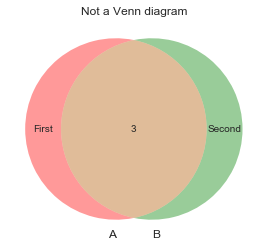

In [216]:
v = venn2(subsets=(1,1,3))
v.get_label_by_id('100').set_text('First')
v.get_label_by_id('010').set_text('Second')
plt.title("Not a Venn diagram")
plt.show()


## Signature Genes

In [219]:
def Norm01(L):
    newL=[i for i in L if i!=np.nan]
    Min=min(newL)
    R=max(newL)-Min
    return [float(i-Min)/R for i in L]

def RandomModel_Qvalue(ClinicalDF_input,R,P,N,Rep=500):
    random.seed(666)
    P_random=[]
    R_random=[]
    for n in range(Rep):
        if n%200==0:
            print n
        r,p=scipy.stats.pearsonr(ClinicalDF_input['MRSS'],ExpDF[ClinicalDF_input.index].loc[random.sample(ExpDF.index,N)].apply(np.mean,axis=0))                  
        P_random.append(p)
        R_random.append(r)
    return sum([1 for i in range(Rep) if (P_random[i]<P) or (R_random[i]>R)])/float(Rep)


def Scatterplot(df,x,y,N,label,Dir,hue='State'):
    plt.style.use('seaborn-white')
#     fig1=plt.figure(figsize=(4,5))
#     ax1=fig1.add_axes([0.15,0.15,0.75,0.75])
    sns.lmplot(x=x, y=y, hue=hue,data=df,palette={'Affected':'#343086','SSc':'#343086'})
    R,P=scipy.stats.pearsonr(df[x],df[y])
    Q=RandomModel_Qvalue(df,R,P,N,Rep=500)
    Title='Relation:{},Pval:{},Qval:{}'.format(str(R),str(P),str(Q))
    plt.title(Title)
    plt.tick_params(labelsize=20,length=5,direction='out')
    plt.savefig(os.path.join(Dir,label+'.lmPlot.pdf'))
    plt.show()
    
def BoxSwarmplot(df,x,y,label,Dir):
    plt.style.use('seaborn-white')
    fig=plt.figure(figsize=(2,3))
    ax=fig.add_axes([0.15,0.15,0.75,0.75])
    sns.boxplot(x=x,y=y,data=df,linewidth=0.5,order=['Norm','Unaffected','Affected'],width=0.65,palette={'Norm':'#696BA8','Affected':'#D56566','Unaffected':'#E7A58A'},ax=ax,fliersize=0) 
    sns.swarmplot(x=x,y=y,data=df,order=['Norm','Unaffected','Affected'],palette={'Norm':'#303082','Affected':'#C22227','Unaffected':'#CE5C27'},size=4,linewidth=0,ax=ax,dodge=True) 
    N=df[df[x]=='Norm'][y]
    A=df[df[x]=='Affected'][y]
    U=df[df[x]=='Unaffected'][y]
    _,p1=scipy.stats.mannwhitneyu(N,A)
    _,p2=scipy.stats.mannwhitneyu(N,U)
    _,p3=scipy.stats.mannwhitneyu(A,U)
    plt.title('N-A:{}, N-U:{},U-A:{}'.format(str(p1),str(p2),str(p3)))
    plt.tick_params(labelsize=8,length=2,direction='out')
    plt.savefig(os.path.join(Dir,label+'.BoxSwarmPlot.pdf'))
    plt.show()
    

def GetSignatueGenes(Dir,Celltypes,Label,BedDF,CellTypeSpecificPeaks_Dict, PeakAnoDF ):
    Dir=os.path.join(Dir,Label)
    Mkdir(Dir)
    Peaks=[]
    for i in Celltypes:
        Peaks=Peaks+CellTypeSpecificPeaks_Dict[i]
    DF=BedDF.loc[list(set(Peaks))]
    DF['Genes']=PeakAnoDF.loc[DF.index]['Gene Name']
    SaveBed(DF, os.path.join(Dir, Label+'.Specific.PeaksAndGenes.txt'))
    Genes=list(set(DF['Genes'].dropna()))
    Probs=[]
    for g in Genes:
        Probs=Probs+list(AnoDF[AnoDF['GENE_SYMBOL']==g].index)
    Probs=list(set(Probs))
    
    Overlap=[i for i in Probs if i in list(ResponseGenes.index)]
    Probs_rmMMF=[i for i in Probs if i not in list(ResponseGenes.index)]
    v = venn2(subsets=(len(Probs_rmMMF),len(ResponseGenes)-len(Overlap),len(Overlap)))
    v.get_label_by_id('100').set_text('Celltype_Specific\n'+str(len(Probs_rmMMF)))
    v.get_label_by_id('010').set_text('MMF_ResponseGenes\n'+str(len(ResponseGenes)-len(Overlap)))
    plt.savefig(os.path.join(Dir,'Venn.Celltype_SpecificProbs.Overlap.MMF_ResponseGenes.pdf'))

    
    
    ExpDF_Peaks=ExpDF.loc[Probs].dropna(how='all')
    ExpDF_Peaks=ExpDF_Peaks[ExpDF_Peaks.apply(np.max,axis=1)>0]
    Label=Label+'.'+str(len(Probs))
    ClinicalDF[Label]=ExpDF_Peaks.apply(np.mean,axis=0)
    
    ExpDF_Peaks=ExpDF.loc[Probs_rmMMF].dropna(how='all')
    ExpDF_Peaks=ExpDF_Peaks[ExpDF_Peaks.apply(np.max,axis=1)>0]
    Label_rmMMF=Label.split('.')[0]+'.'+str(len(Probs_rmMMF))+'.Remove_MMF_ResponseGenes'
    ClinicalDF[Label_rmMMF]=ExpDF_Peaks.apply(np.mean,axis=0)
    
    
    ClinicalDF_LA=ClinicalDF[(ClinicalDF['Last']=='LA')|(ClinicalDF['Last']=='RA')]
    ClinicalDF_LF=ClinicalDF[(ClinicalDF['Last']=='LF')|(ClinicalDF['Last']=='RF')]
    
    ClinicalDF_Improver_LA=ClinicalDF_LA.loc[[i for i in ClinicalDF_LA.index if ClinicalDF_LA.loc[i]['Patients'] in Improver]]
    ClinicalDF_Improver_LF=ClinicalDF_LF.loc[[i for i in ClinicalDF_LF.index if ClinicalDF_LF.loc[i]['Patients'] in Improver]]
    ClinicalDF_Improver=ClinicalDF.loc[[i for i in ClinicalDF.index if ClinicalDF.loc[i]['Patients'] in Improver]]
    
    
    print Improver
    
    
    Scatterplot(ClinicalDF_LA,'MRSS',Label,len(Probs),Label+'_SamplesLA',Dir,hue='State')
#    Scatterplot(ClinicalDF_LF,'MRSS',Label,len(Probs),Label+'_SamplesLF',Dir,hue='State')
    Scatterplot(ClinicalDF_Improver_LA,'MRSS',Label,len(Probs),Label+'_Samples_ImproverLA',Dir,hue='State')
#    Scatterplot(ClinicalDF_Improver_LF,'MRSS',Label,len(Probs),Label+'_Samples_ImproverLF',Dir,hue='State')
    Scatterplot(ClinicalDF_Improver,'MRSS',Label,len(Probs),Label+'_AllSamples_Improver',Dir,hue='State')
    Scatterplot(ClinicalDF,'MRSS',Label,len(Probs),Label+'_AllSamples',Dir,hue='State')
    
    #rmMMF=remove MMF response genes
    Scatterplot(ClinicalDF_LA,'MRSS',Label_rmMMF,len(Probs_rmMMF),Label_rmMMF+'_SamplesLA',Dir,hue='State')
#    Scatterplot(ClinicalDF_LF,'MRSS',Label_rmMMF,len(Probs_rmMMF),Label_rmMMF+'_SamplesLF',Dir,hue='State')
    Scatterplot(ClinicalDF_Improver_LA,'MRSS',Label_rmMMF,len(Probs_rmMMF),Label_rmMMF+'_Samples_ImproverLA',Dir,hue='State')
#    Scatterplot(ClinicalDF_Improver_LF,'MRSS',Label_rmMMF,len(Probs_rmMMF),Label_rmMMF+'_Samples_ImproverLF',Dir,hue='State')
    Scatterplot(ClinicalDF_Improver,'MRSS',Label_rmMMF,len(Probs_rmMMF),Label_rmMMF+'_AllSamples_Improver',Dir,hue='State')
    Scatterplot(ClinicalDF,'MRSS',Label_rmMMF,len(Probs_rmMMF),Label_rmMMF+'_AllSamples',Dir,hue='State')
    
    
    #### Lowest MRSS and highest MRSS of one patients
    
    def GetPatientDF(Clinicaldf,Dir, label):
        plt.style.use('seaborn-white')
        fig1=plt.figure(figsize=(2,5))
        ax1=fig1.add_axes([0.15,0.15,0.75,0.75])   
        AllPatients=set(Clinicaldf['Patients'])
        Clinicaldf_Patients=pd.DataFrame({},index=AllPatients)
        MinMRSS=[]
        MaxMRSS=[]
        Patients=[]
        MinScore=[]
        MaxScore=[]
        for p in AllPatients:
            subdf=Clinicaldf[Clinicaldf['Patients']==p]
            minMrss=min(subdf['MRSS'])
            maxMrss=max(subdf['MRSS'])
            if maxMrss-minMrss>=5:
                MIN=np.mean(Clinicaldf.loc[list(subdf[subdf['MRSS']==minMrss].index)][Label])
                MAX=np.mean(Clinicaldf.loc[list(subdf[subdf['MRSS']==maxMrss].index)][Label])
                ax1.plot([0.5,1.5],[MIN,MAX],linewidth=2,color='K',marker='o',markersize=5)
                MinMRSS.append(minMrss)
                MaxMRSS.append(maxMrss)
                Patients.append(p)
                MinScore.append(MIN)
                MaxScore.append(MAX)
        outDF=pd.DataFrame({'Minimum_mRSS':MinMRSS,'Maxmum_mRSS':MaxMRSS,label+'_of_Samples_With_Minimum_mRSS':MinScore,label+'_of_Samples_With_Maxmum_mRSS':MaxScore},index=Patients)        
        Save(outDF,os.path.join(Dir,label+'.min_and_max.mRSS_SignatureScore.individuals.txt'))
        plt.title(scipy.stats.ttest_rel(MinScore,MaxScore,nan_policy='propagate')[1])
        plt.tick_params(labelsize=20,length=5,direction='out')
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        plt.savefig(os.path.join(Dir,label+'.min_and_max.mRSS_SignatureScore.individuals.pdf'))    
        plt.show()   
    #rmMMF=remove MMF response genes
    GetPatientDF(ClinicalDF_LA,Dir, Label+'_SamplesLA')            
#    GetPatientDF(ClinicalDF_LF,Dir, Label+'_SamplesLF')
    GetPatientDF(ClinicalDF_Improver_LA,Dir, Label+'_Samples_ImproverLA')
#    GetPatientDF(ClinicalDF_Improver_LF,Dir, Label+'_Samples_ImproverLF')
    GetPatientDF(ClinicalDF_Improver,Dir, Label+'_AllSamples_Improver')
    GetPatientDF(ClinicalDF,Dir, Label+'_AllSamples')
    
    GetPatientDF(ClinicalDF_LA,Dir, Label_rmMMF+'_SamplesLA')
#    GetPatientDF(ClinicalDF_LF,Dir, Label_rmMMF+'_SamplesLF')
    GetPatientDF(ClinicalDF_Improver_LA,Dir, Label_rmMMF+'_Samples_ImproverLA')
#    GetPatientDF(ClinicalDF_Improver_LF,Dir, Label_rmMMF+'_Samples_ImproverLF')
    GetPatientDF(ClinicalDF_Improver,Dir, Label_rmMMF+'_AllSamples_Improver')
    GetPatientDF(ClinicalDF,Dir, Label_rmMMF+'_AllSamples')
    
    

['DC']
['03', '04', '05', '06', '10', '16', '17', '21', '30', '33', '37', '42', '45']
0
200
400


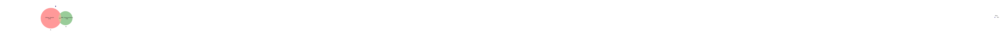

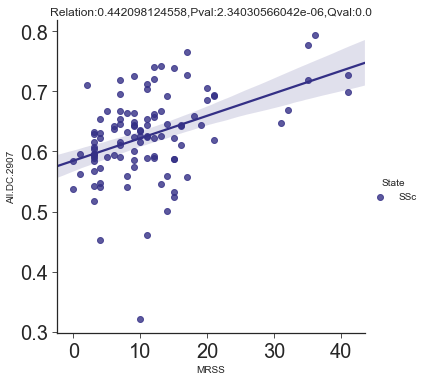

0
200
400


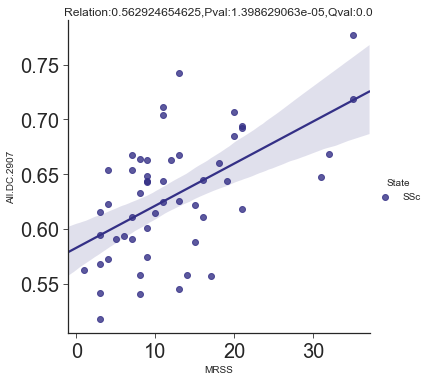

0
200
400


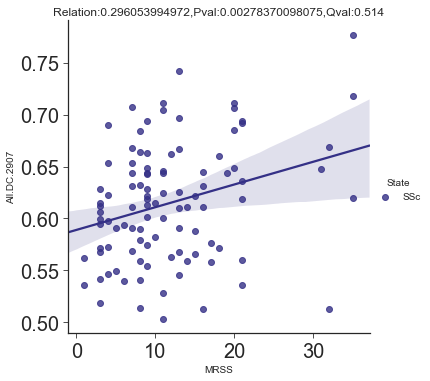

0
200
400


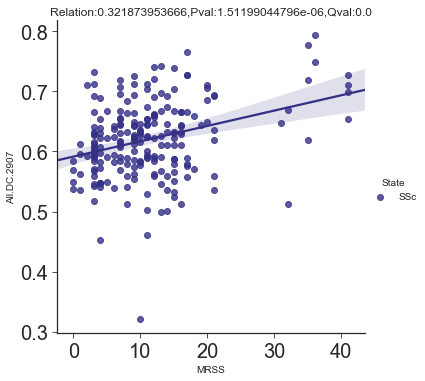

0
200
400


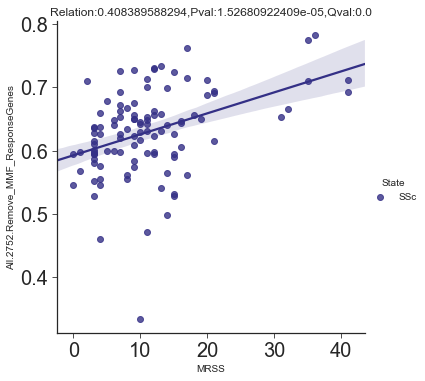

0
200
400


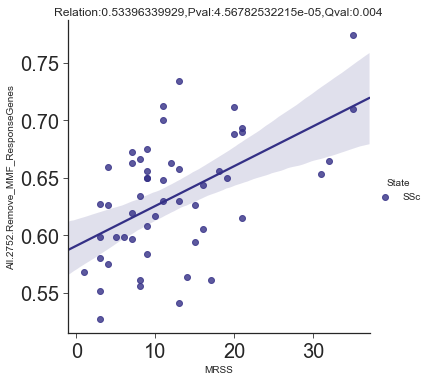

0
200
400


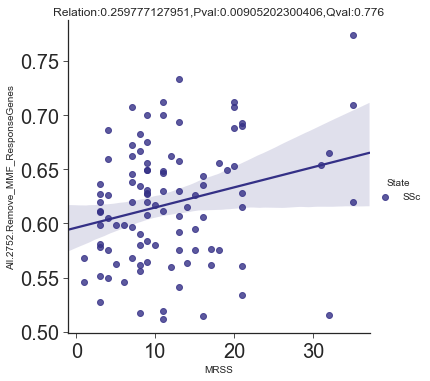

0
200
400


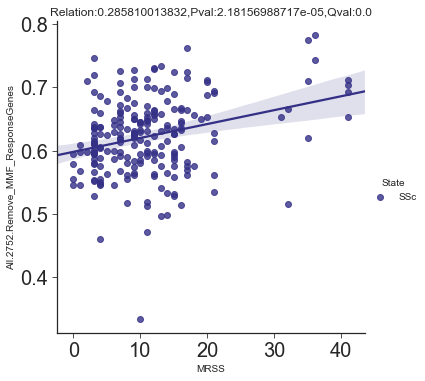

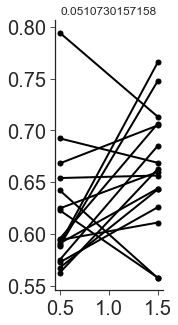

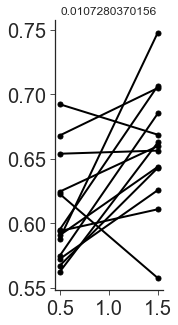

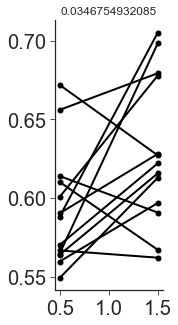

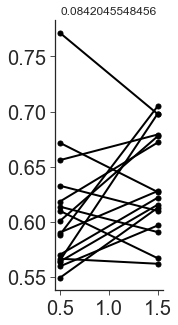

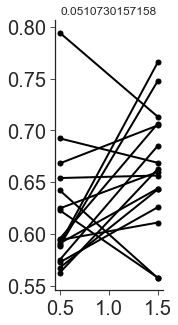

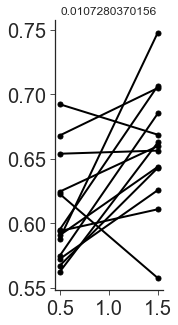

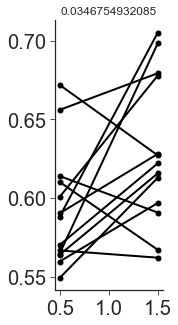

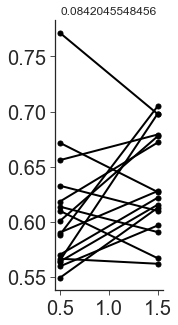

['Fib']
['03', '04', '05', '06', '10', '16', '17', '21', '30', '33', '37', '42', '45']
0
200
400


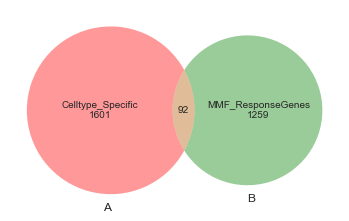

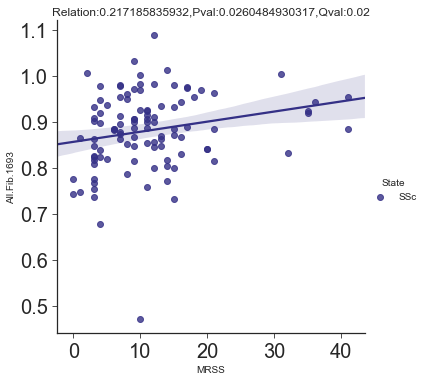

0
200
400


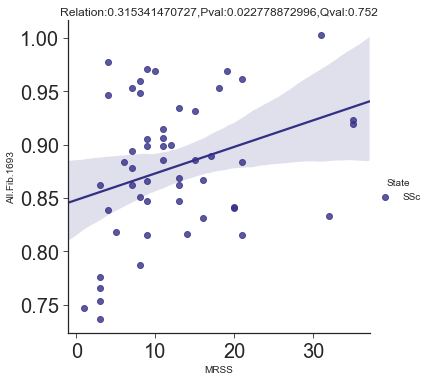

0
200
400


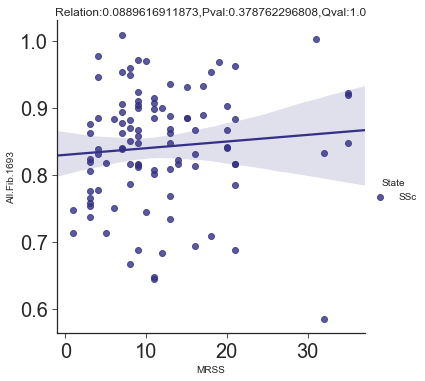

0
200
400


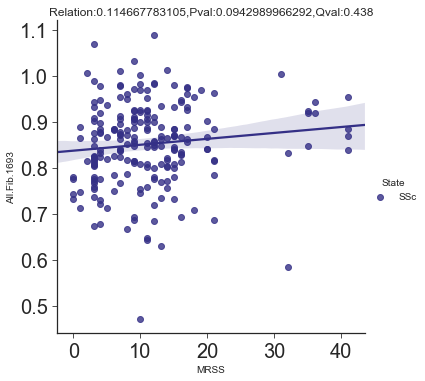

0
200
400


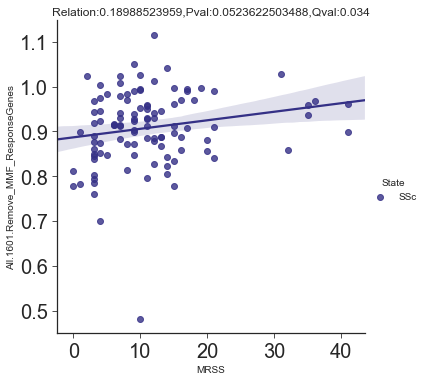

0
200
400


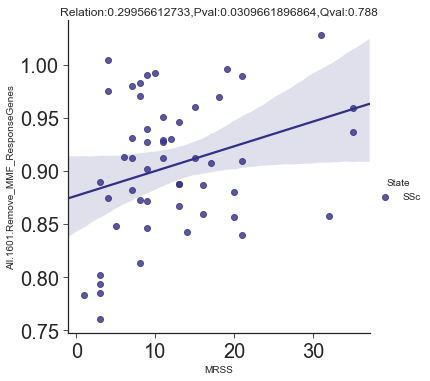

0
200
400


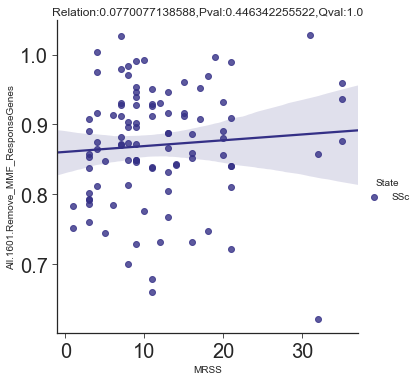

0
200
400


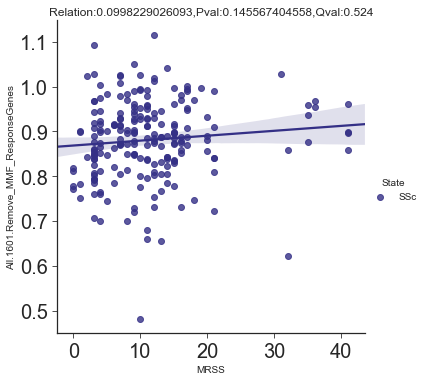

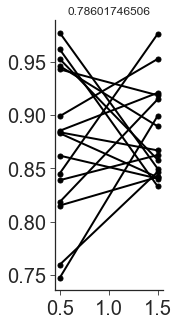

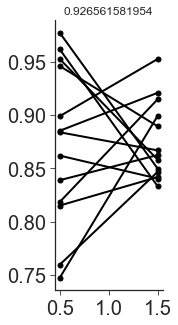

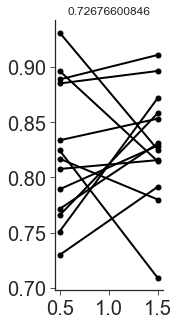

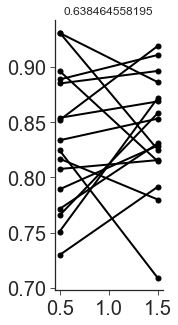

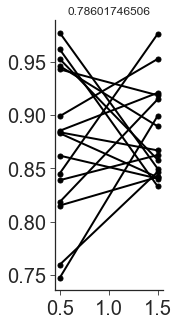

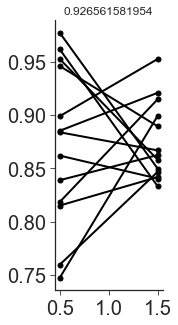

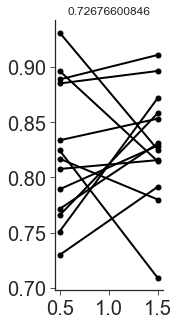

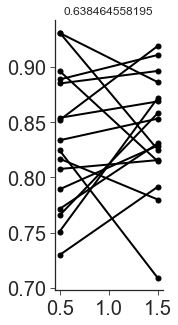

['LC']
['03', '04', '05', '06', '10', '16', '17', '21', '30', '33', '37', '42', '45']
0
200
400


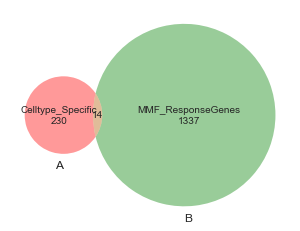

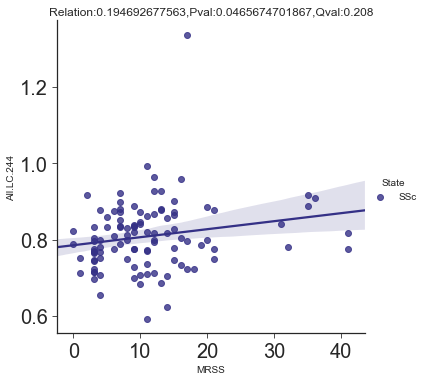

0
200
400


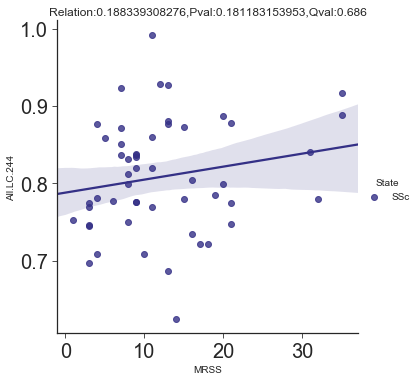

0
200
400


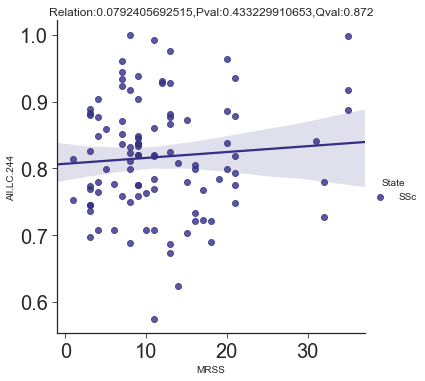

0
200
400


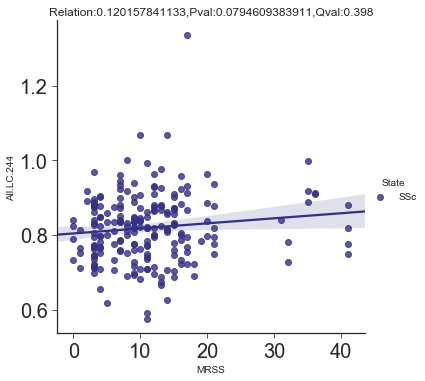

0
200
400


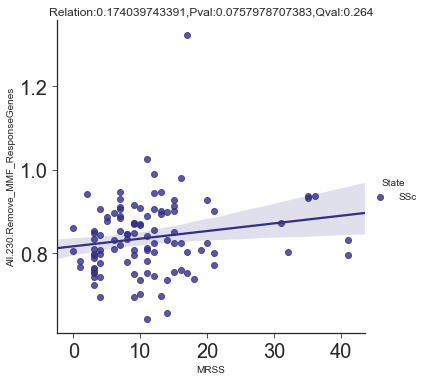

0
200
400


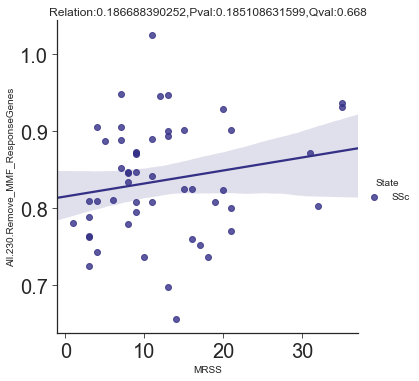

0
200
400


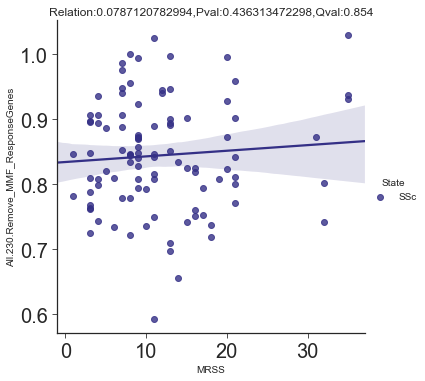

0
200
400


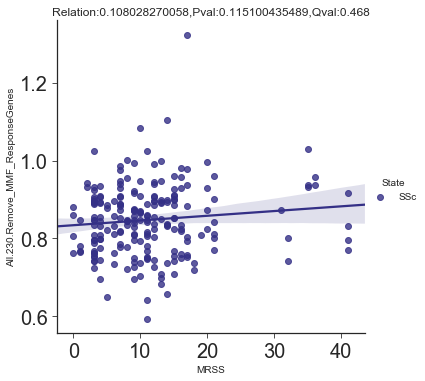

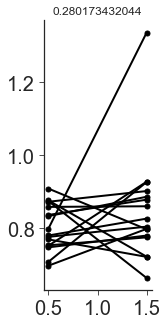

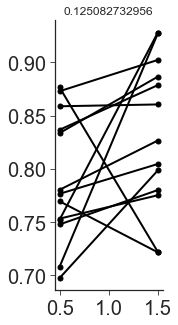

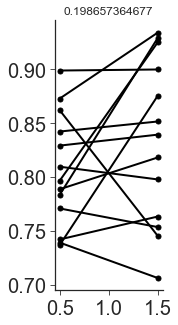

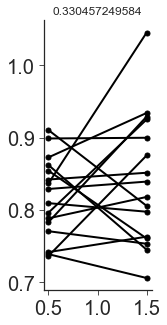

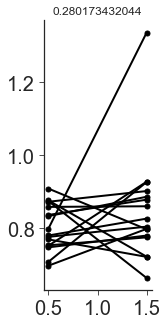

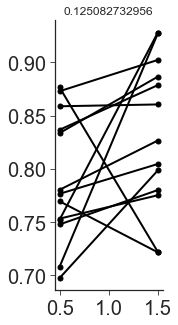

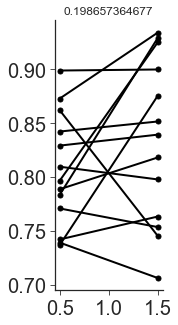

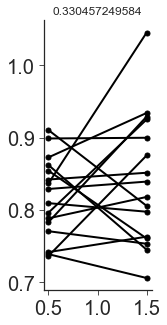

['EC']
['03', '04', '05', '06', '10', '16', '17', '21', '30', '33', '37', '42', '45']
0
200
400


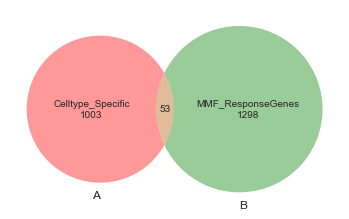

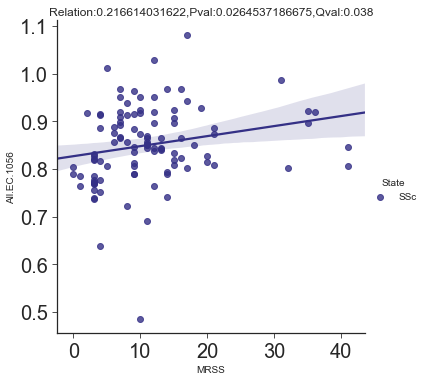

0
200
400


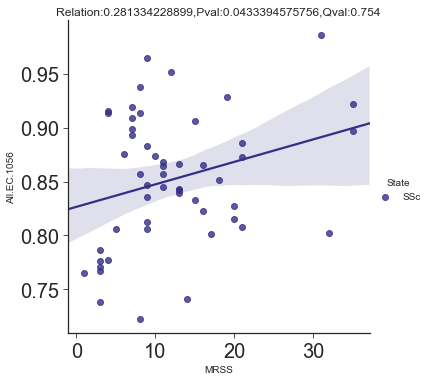

0
200
400


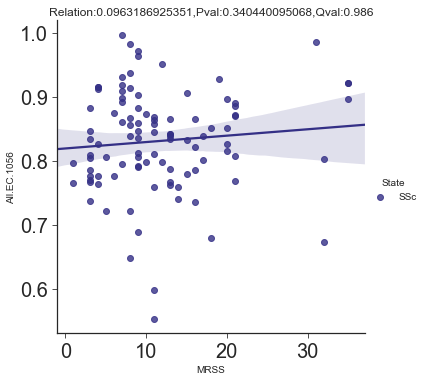

0
200
400


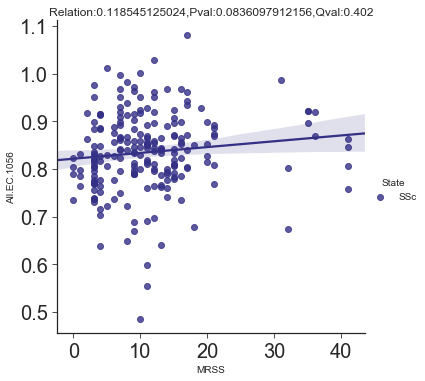

0
200
400


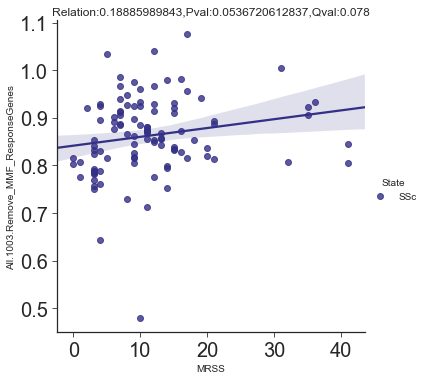

0
200
400


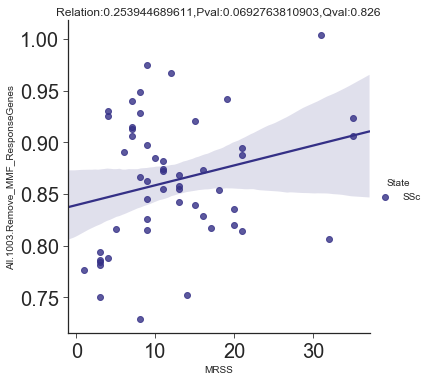

0
200
400


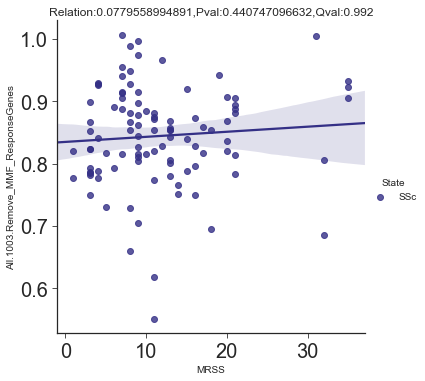

0
200
400


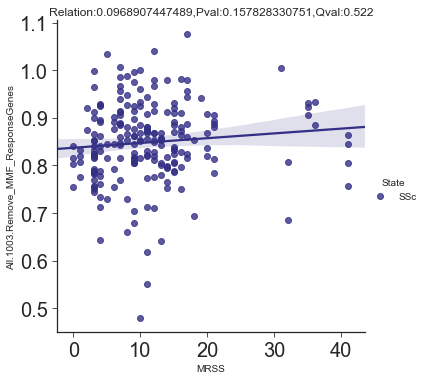

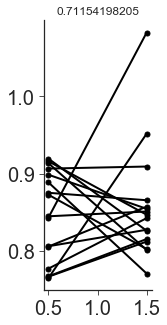

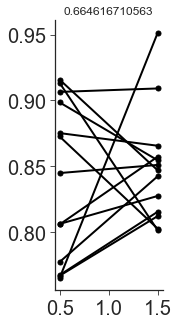

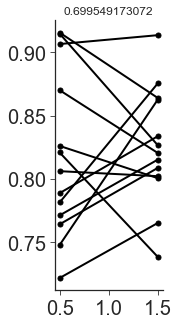

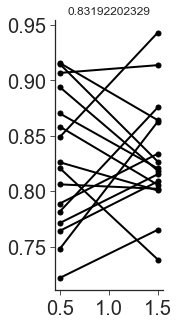

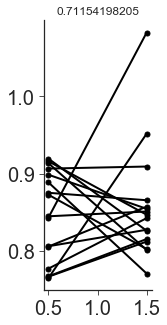

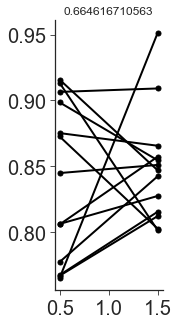

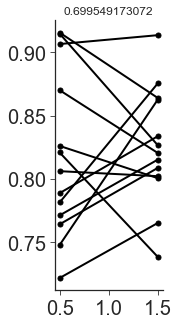

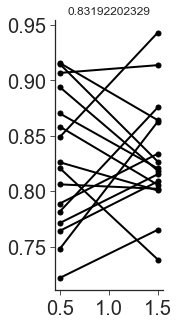

['CD4', 'CD4-CD8', 'CD8']
['03', '04', '05', '06', '10', '16', '17', '21', '30', '33', '37', '42', '45']
0
200
400


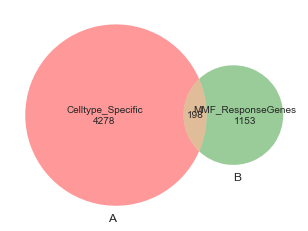

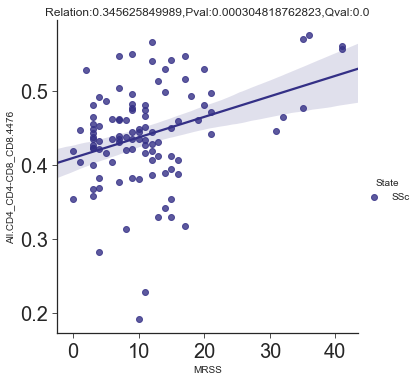

0
200
400


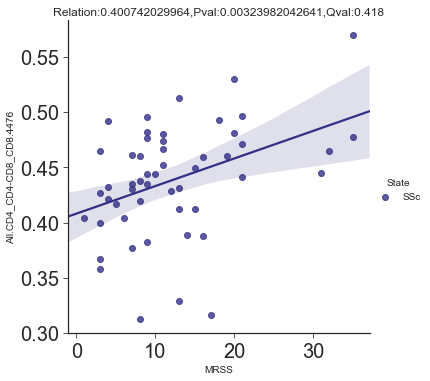

0
200
400


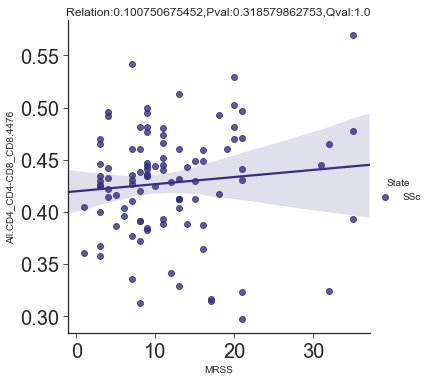

0
200
400


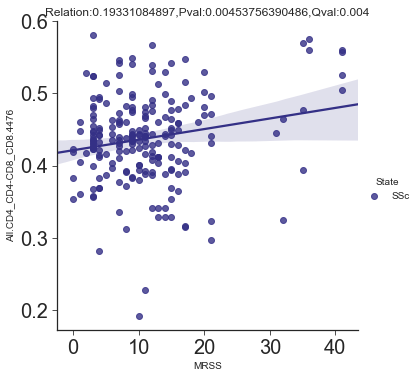

0
200
400


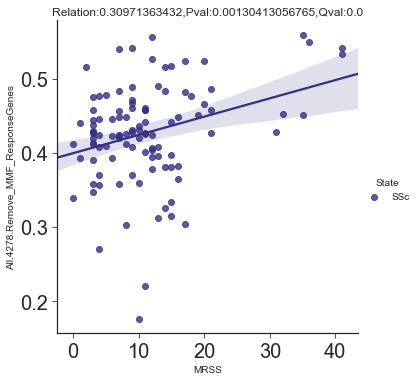

0
200
400


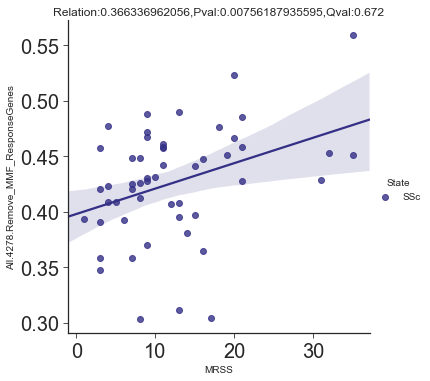

0
200
400


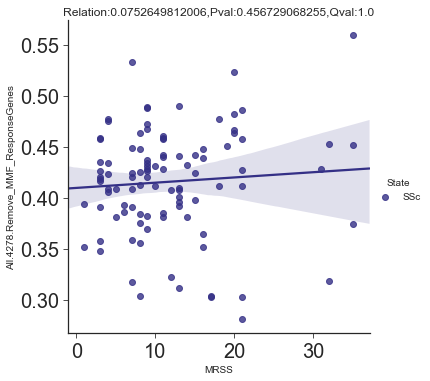

0
200
400


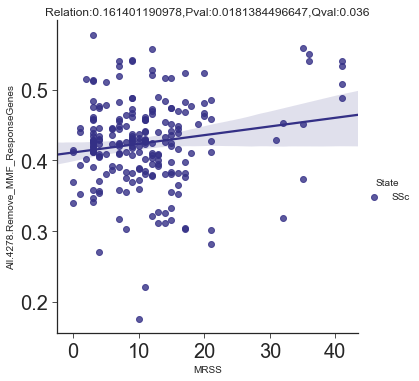

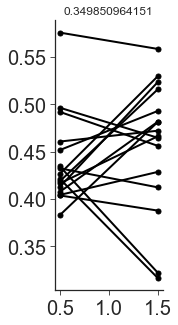

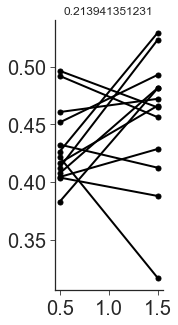

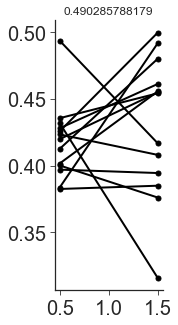

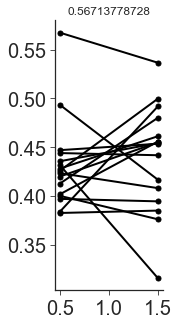

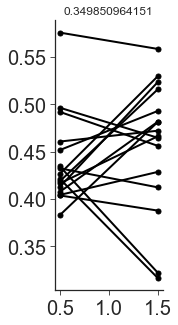

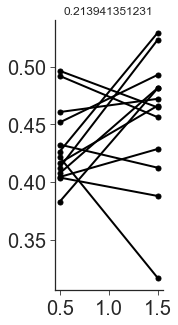

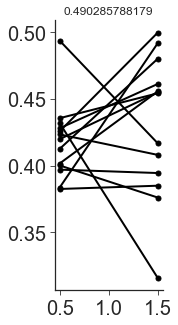

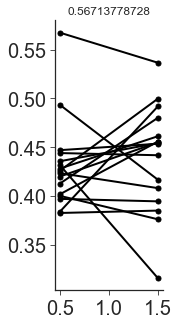

['KC']
['03', '04', '05', '06', '10', '16', '17', '21', '30', '33', '37', '42', '45']
0
200
400


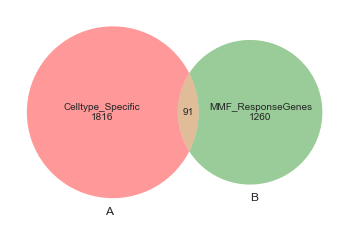

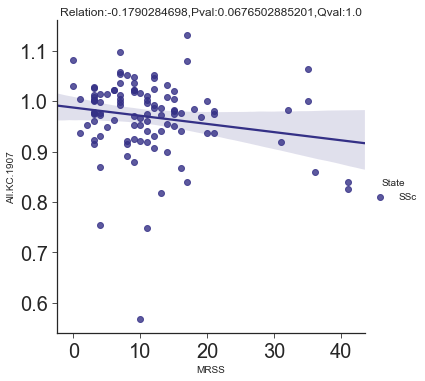

0
200
400


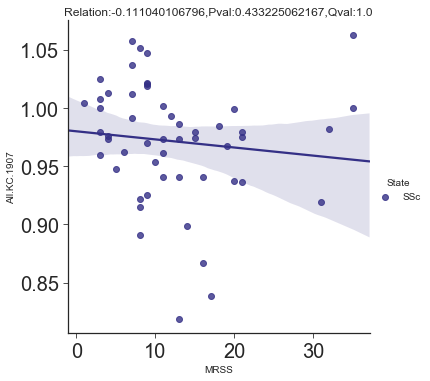

0
200
400


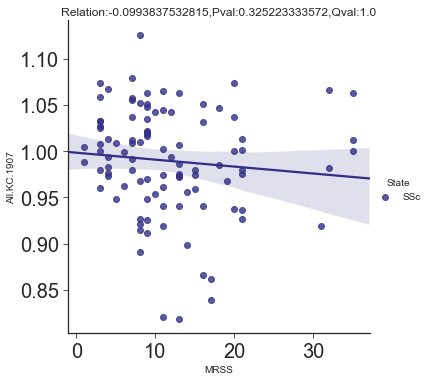

0
200
400


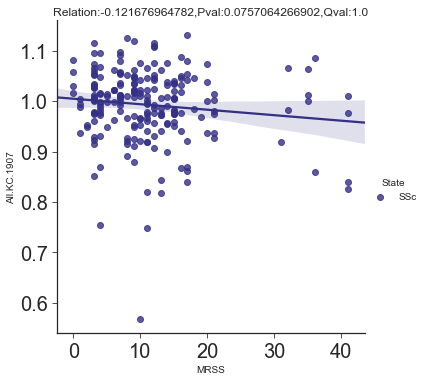

0
200
400


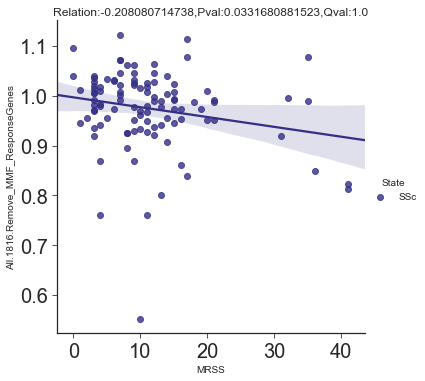

0
200
400


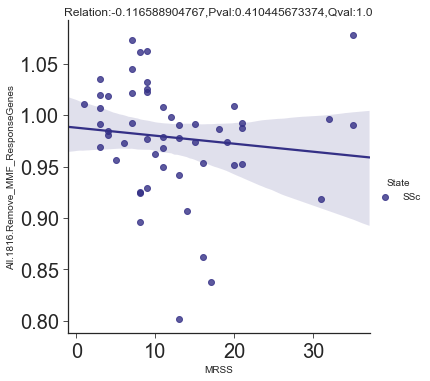

0
200
400


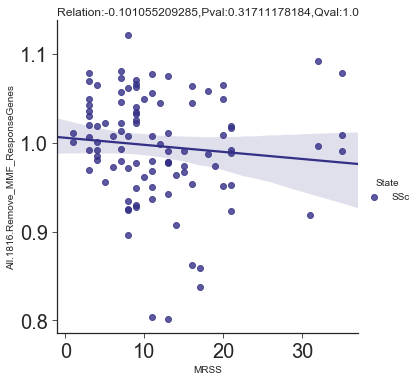

0
200
400


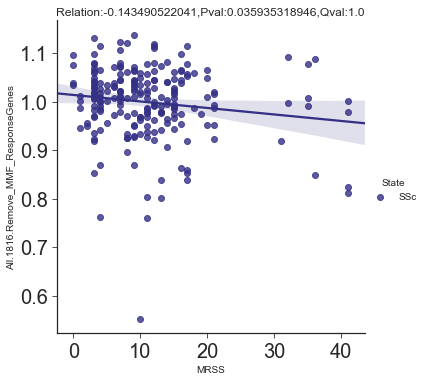

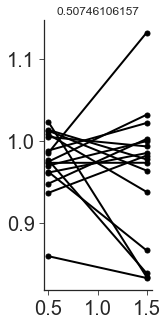

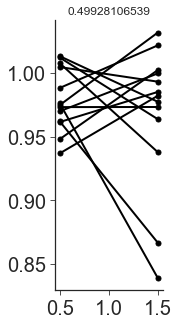

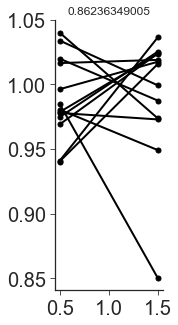

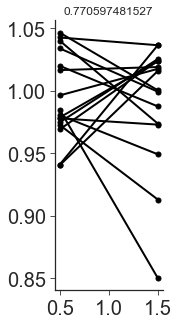

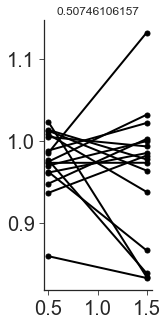

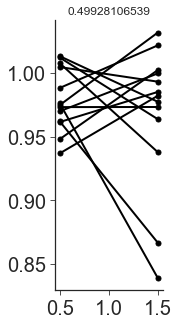

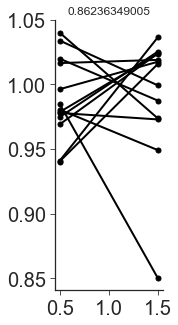

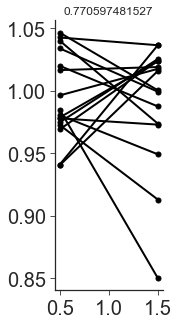

In [220]:

for cts in [['DC'],['Fib'],['LC'],['EC'],['CD4','CD4-CD8','CD8'],['KC']]:    #['DC-LC'],['DC-LC','DC'],
    print cts
    GetSignatueGenes(DirAll,cts,'All.'+'_'.join(cts),AllBedDF,AllCellTypeSpecificPeaks_Dict, AllAnoDF )

Save(ClinicalDF, os.path.join(DirAll,'CelltypeSignatureScore.txt')) 




In [ ]:
#
# for cts in [['Fib'],['DC'],['EC'],['CD4','CD4-CD8','CD8'],['Mac']]:
#     print cts
#     GetSignatueGenes(DirAllCommon,cts,'AllCommon.'+'_'.join(cts),AllCommonBedDF,AllCommonCellTypeSpecificPeaks_Dict, AllCommonAnoDF )

# Save(ClinicalDF, os.path.join(DirAllCommon,'CelltypeSignatureScore.txt')) 



In [ ]:
#
for cts in [['Fib'],['DC-LC'],['DC'],['DC-LC','DC'],['LC'],['EC'],['CD4','CD4-CD8','CD8'],['KC']]:
    print cts
    GetSignatueGenes(DirNorm,cts,'Norm.'+'_'.join(cts),NormBedDF,NormCellTypeSpecificPeaks_Dict, NormAnoDF )

Save(ClinicalDF, os.path.join(DirNorm,'CelltypeSignatureScore.txt'))     
    

In [ ]:
DirAll

# GSE58095

In [1116]:
DirNorm=os.path.join(outDirNorm,'mRSSCorrelation_GSE58095')
DirAllCommon=os.path.join(outDirAllCommon,'mRSSCorrelation_GSE58095')
DirAll=os.path.join(outDirAll,'mRSSCorrelation_GSE58095')
Mkdir(DirNorm)
Mkdir(DirAllCommon)
Mkdir(DirAll)

ExpFile='/Users/liuqian/Documents/A_SSC_project/A_Code_available/Published_Data/GSE58095/GSE58095_non-normalized.Data.txt'
AnoFile='/Users/liuqian/Documents/A_SSC_project/A_Code_available/Published_Data/GSE58095/GPL10558-50081.txt'
ClinicalFile="/Users/liuqian/Documents/A_SSC_project/A_Code_available/Published_Data/GSE58095/GSE58095_all_sample_annotatiions.txt"

ExpDF=ReadTable(ExpFile)         
AnoDF=ReadTable(AnoFile)
ClinicalDF=ReadTable(ClinicalFile)   



In [1117]:
#Samples=list((ClinicalDF['Characteristics: total skin score']+ClinicalDF['Characteristics: Skin score at biopsy site']).dropna().index)        
#ClinicalDF=ClinicalDF.loc[Samples]
#ClinicalDF=ClinicalDF[ClinicalDF['characteristics: Affected (1=yes)']==1]
#ExpDF=ExpDF[ClinicalDF.index]

In [1118]:
#Normalization
#SizeFactor=(ExpDF.T/ExpDF.apply(gmean,axis=1)).dropna(axis=1,how='any').apply(np.median,axis=1)
#ExpDF=ExpDF/SizeFactor
rank_mean=ExpDF.stack().groupby(ExpDF.rank(method='first').stack().astype(int)).mean()
ExpDF=ExpDF.rank(method='min').stack().astype(int).map(rank_mean).unstack()


In [1119]:
ExpDF=(ExpDF+1).apply(np.log2)
ExpDF=ExpDF[(ExpDF.apply(np.max,axis=1)>4)]


In [1120]:
ClinicalDF['Totla_MRSS']=ClinicalDF['Characteristics: total skin score']
ClinicalDF['MRSS']=ClinicalDF['Characteristics: Skin score at biopsy site']
State=[]
for i in ClinicalDF.index:
    if ClinicalDF['Characteristics: Group'][i]=='Control':
        State.append('Norm')
    elif ClinicalDF['characteristics: Affected (1=yes)'][i]==1:
        State.append('Affected')
    else:
        State.append('Unaffected')
ClinicalDF['State']=State  
    
    

In [1121]:

def GetSignatueGenes(Dir,Celltypes,Label,BedDF,CellTypeSpecificPeaks_Dict, PeakAnoDF ):
    Dir=os.path.join(Dir,Label)
    Mkdir(Dir)
    Peaks=[]
    for i in Celltypes:
        Peaks=Peaks+CellTypeSpecificPeaks_Dict[i]
    DF=BedDF.loc[list(set(Peaks))]
    DF['Genes']=PeakAnoDF.loc[DF.index]['Gene Name']
    SaveBed(DF, os.path.join(Dir, Label+'.Specific.PeaksAndGenes.txt'))
    Genes=list(set(DF['Genes'].dropna()))
    Probs=[]
    for g in Genes:
        Probs=Probs+list(AnoDF[AnoDF['ILMN_Gene']==g].index)
    Probs=list(set(Probs))
    print len(Probs)
    ExpDF_Peaks=ExpDF.loc[Probs].dropna(how='all')
    ExpDF_Peaks=ExpDF_Peaks[ExpDF_Peaks.apply(np.max,axis=1)>0]
    Label=Label+'_'+str(len(Probs))
    ClinicalDF[Label]=ExpDF_Peaks.apply(np.mean,axis=0)
    ClinicalDF_Affected=ClinicalDF[ClinicalDF['State']=='Affected']
    
    BoxSwarmplot(ClinicalDF,'State',Label,Label+'_ClinicalState',Dir)
   

    Scatterplot(ClinicalDF_Affected,'MRSS',Label,len(Probs),Label+'_AllSamples.mRSS',Dir,hue='State')
    Scatterplot(ClinicalDF_Affected[ClinicalDF_Affected['Totla_MRSS']!=0],'Totla_MRSS',Label,len(Probs),Label+'_AllSamples.TotalmRSS',Dir,hue='State')                  
    


['Fib']
1581


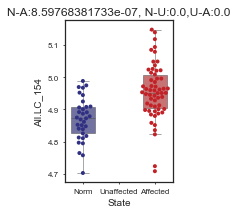

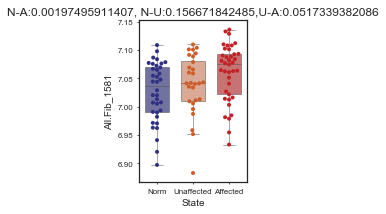

0
200
400
600
800


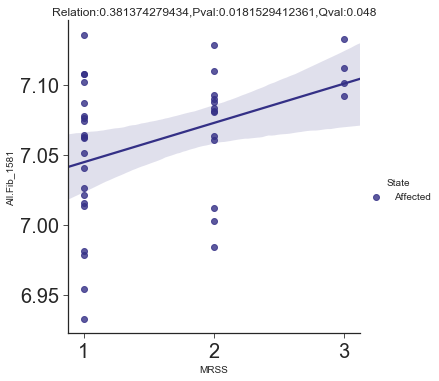

0
200
400
600
800


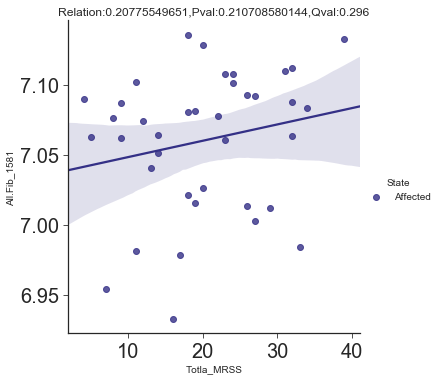

['DC-LC']
634


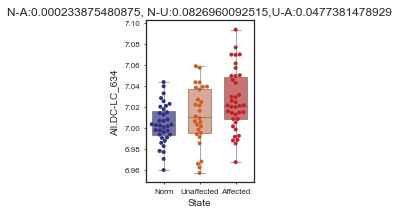

0
200
400
600
800


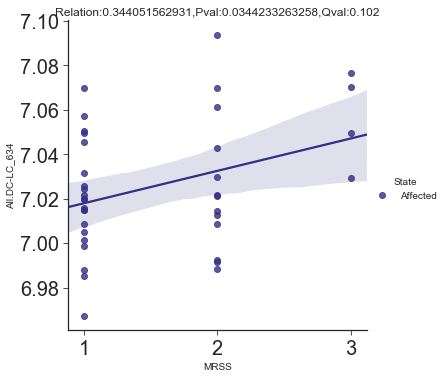

0
200
400
600
800


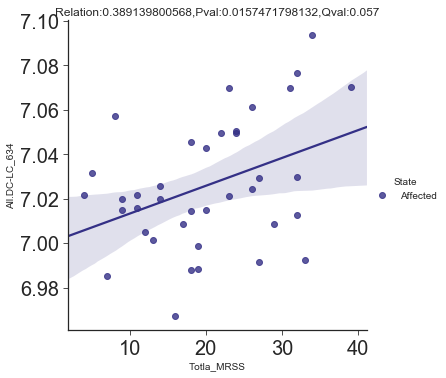

['DC']
2688


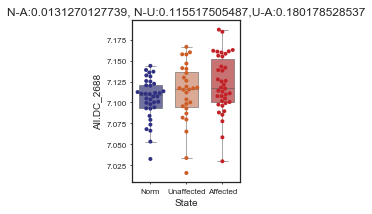

0
200
400
600
800


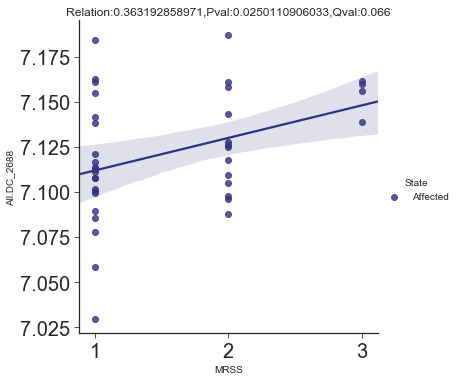

0
200
400
600
800


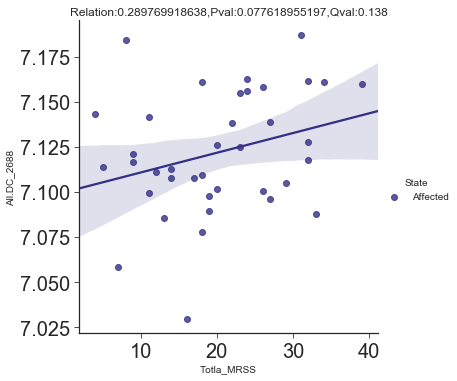

['DC-LC', 'DC']
3059


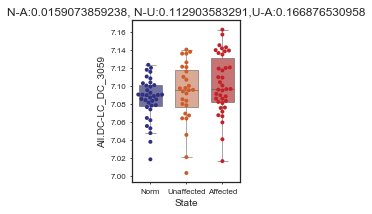

0
200
400
600
800


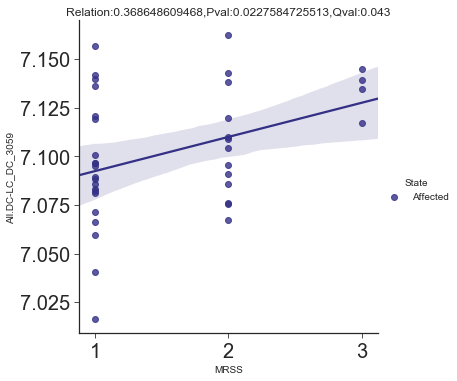

0
200
400
600
800


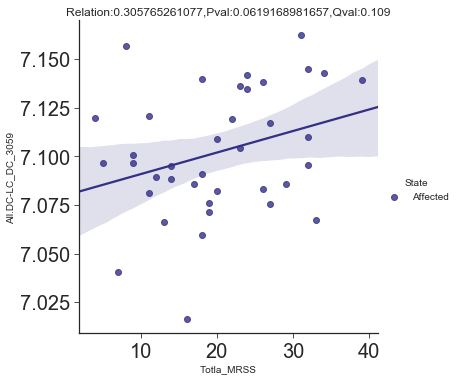

['LC']
221


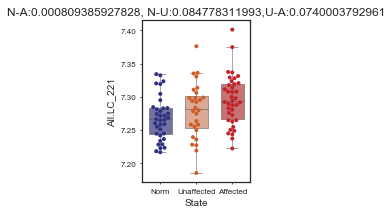

0
200
400
600
800


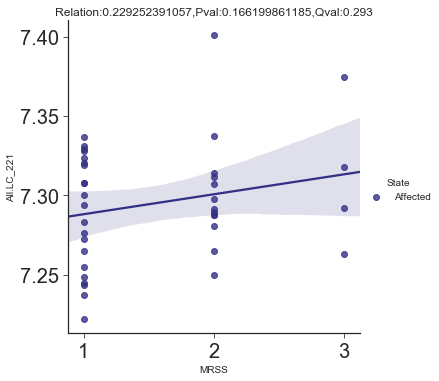

0
200
400
600
800


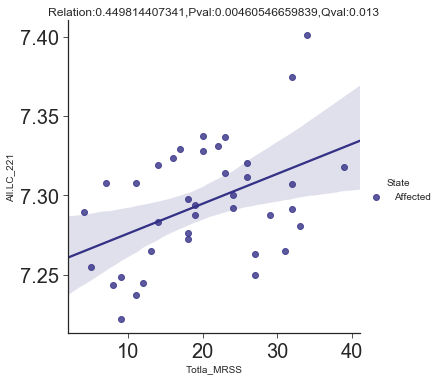

['EC']
1143


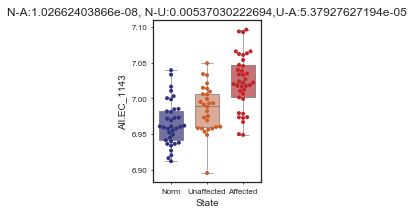

0
200
400
600
800


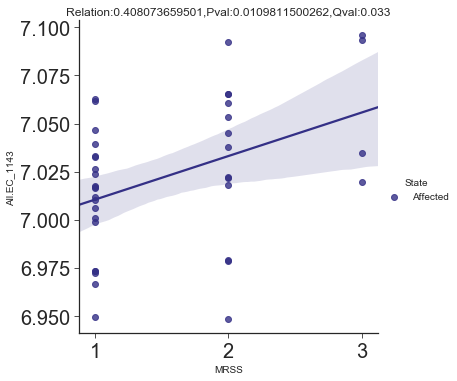

0
200
400
600
800


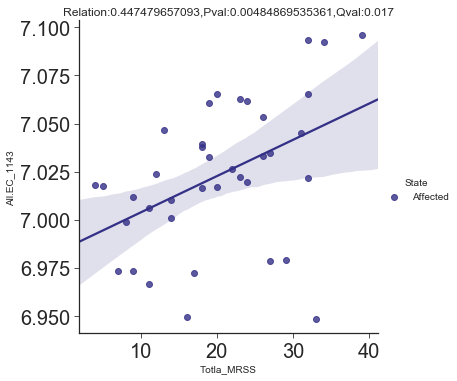

['CD4', 'CD4-CD8', 'CD8']
4140


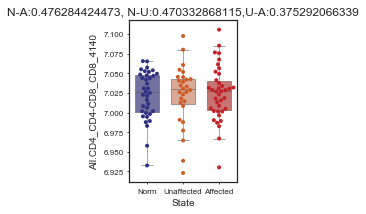

0
200
400
600
800


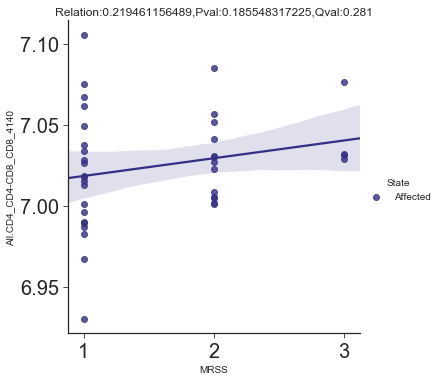

0
200
400
600
800


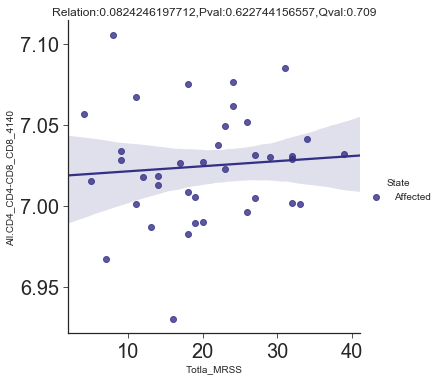

['KC']
1844


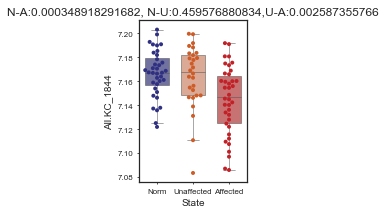

0
200
400
600
800


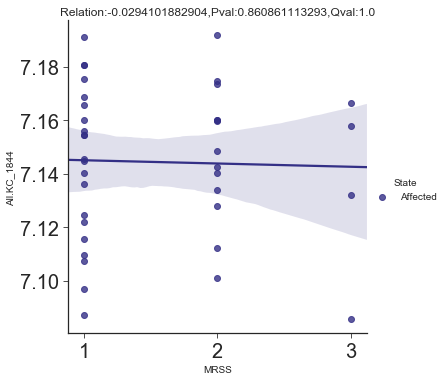

0
200
400
600
800


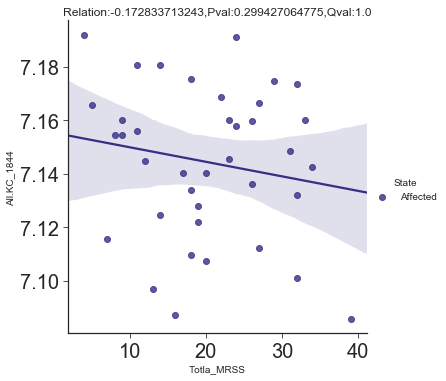

In [1122]:
for cts in [['Fib'],['DC-LC'],['DC'],['DC-LC','DC'],['LC'],['EC'],['CD4','CD4-CD8','CD8'],['KC']]:
    print cts
    GetSignatueGenes(DirAll,cts,'All.'+'_'.join(cts),AllBedDF,AllCellTypeSpecificPeaks_Dict, AllAnoDF )

Save(ClinicalDF, os.path.join(DirAll,'CelltypeSignatureScore.txt')) 



In [1123]:
# #
# for cts in [['Fib'],['DC'],['EC'],['CD4','CD4-CD8','CD8'],['Mac']]:
#     print cts
#     GetSignatueGenes(DirAllCommon,cts,'AllCommon.'+'_'.join(cts),AllCommonBedDF,AllCommonCellTypeSpecificPeaks_Dict, AllCommonAnoDF )

# Save(ClinicalDF, os.path.join(DirAllCommon,'CelltypeSignatureScore.txt')) 



['Fib']
940


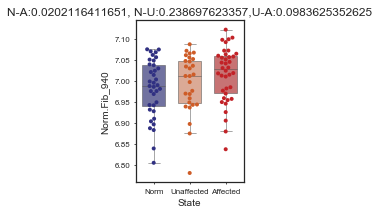

0
200
400
600
800


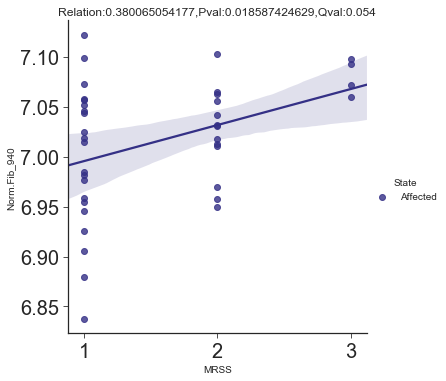

0
200
400
600
800


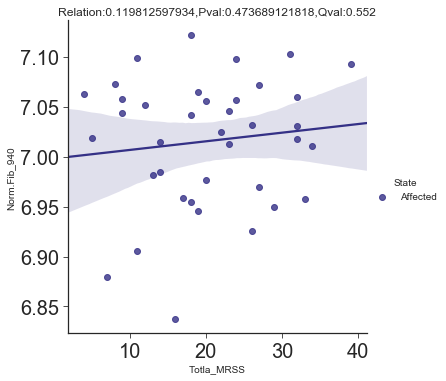

['DC-LC']
2570


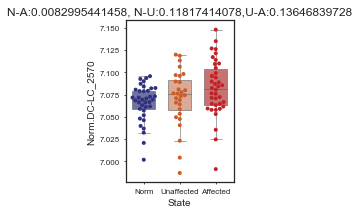

0
200
400
600
800


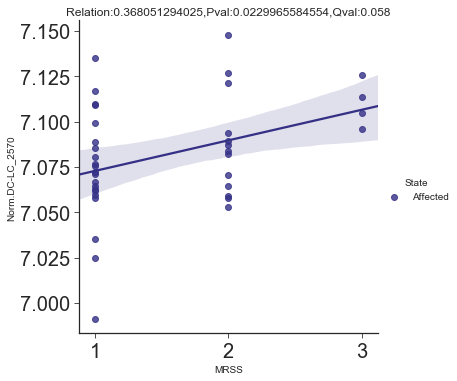

0
200
400
600
800


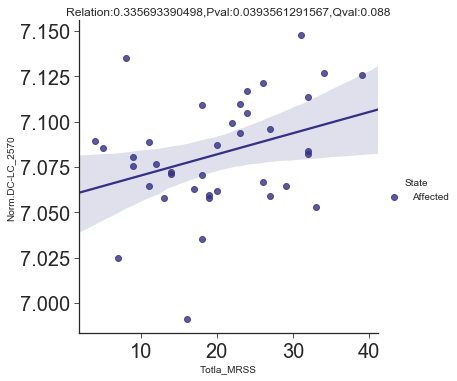

['DC']
1781


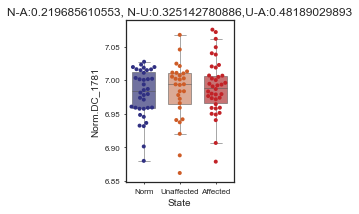

0
200
400
600
800


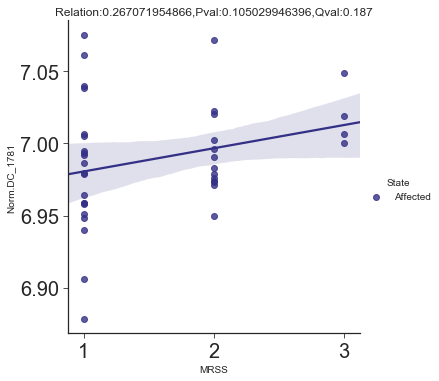

0
200
400
600
800


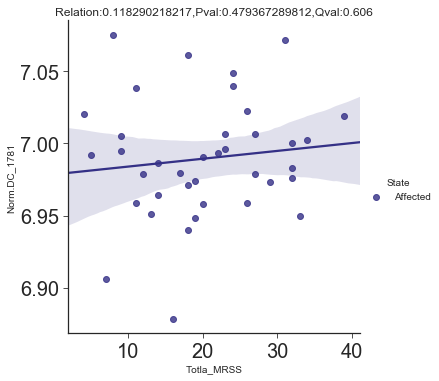

['DC-LC', 'DC']
3766


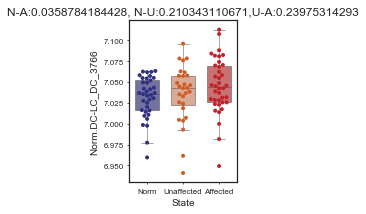

0
200
400
600
800


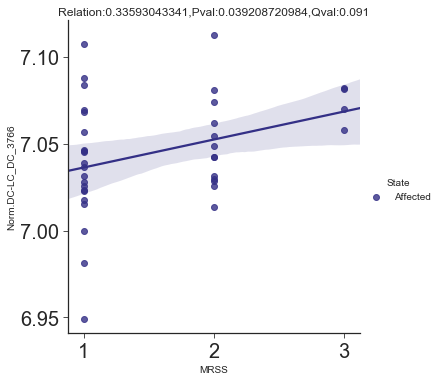

0
200
400
600
800


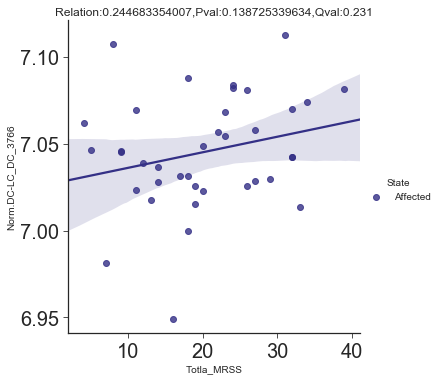

['LC']
469


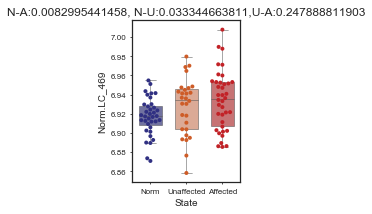

0
200
400
600
800


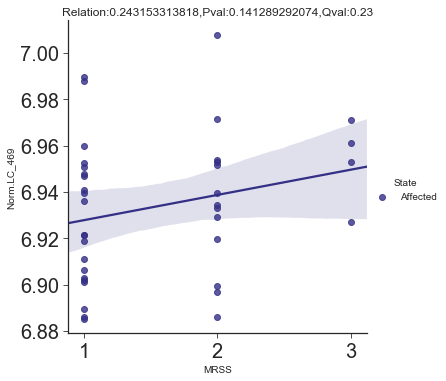

0
200
400
600
800


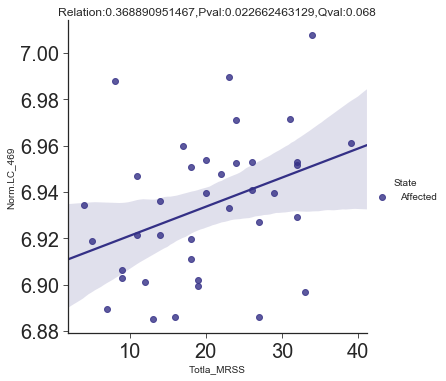

['EC']
903


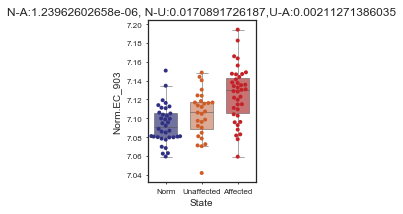

0
200
400
600
800


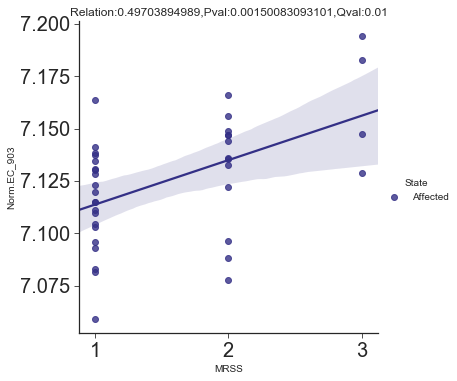

0
200
400
600
800


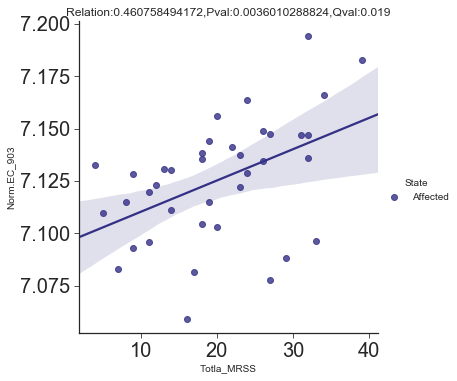

['CD4', 'CD4-CD8', 'CD8']
2812


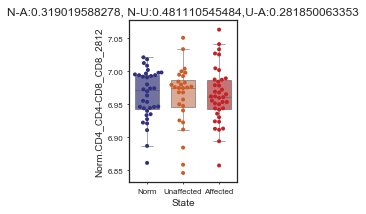

0
200
400
600
800


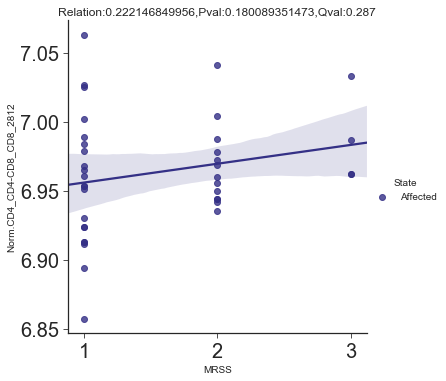

0
200
400
600
800


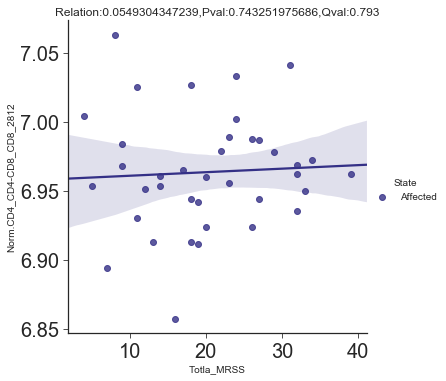

['KC']
2553


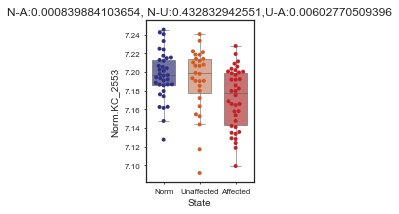

0
200
400
600
800


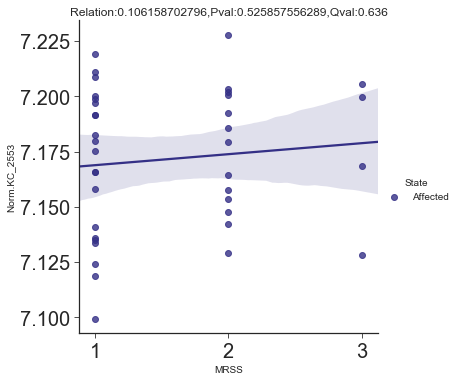

0
200
400
600
800


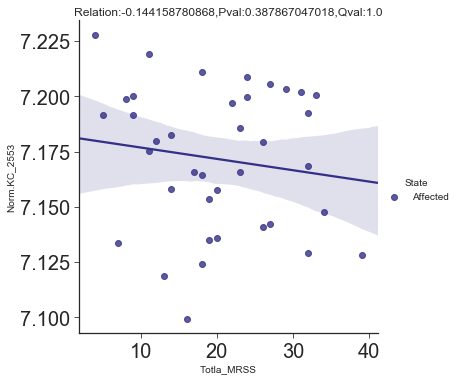

In [1124]:
#
for cts in [['Fib'],['DC-LC'],['DC'],['DC-LC','DC'],['LC'],['EC'],['CD4','CD4-CD8','CD8'],['KC']]:
    print cts
    GetSignatueGenes(DirNorm,cts,'Norm.'+'_'.join(cts),NormBedDF,NormCellTypeSpecificPeaks_Dict, NormAnoDF )

Save(ClinicalDF, os.path.join(DirNorm,'CelltypeSignatureScore.txt'))     
    

# GSE130955

In [37]:
DirNorm=os.path.join(outDirNorm,'mRSSCorrelation_GSE130955')
DirAllCommon=os.path.join(outDirAllCommon,'mRSSCorrelation_GSE130955')
DirAll=os.path.join(outDirAll,'mRSSCorrelation_GSE130955')
Mkdir(DirNorm)
Mkdir(DirAllCommon)
Mkdir(DirAll)

ExpFile='/Users/liuqian/Documents/A_SSC_project/A_Code_available/Published_Data/GSE130955/GSE130955_RPKM.txt'
AnoFile='/Users/liuqian/Documents/A_SSC_project/A_Code_available/Published_Data/GSE130955/genes.txt'

ExpDF=ReadTable(ExpFile)         
AnoDF=pd.read_table(AnoFile,sep='\t',index_col=0)
ClinicalDF=pd.DataFrame({'State':['Norm' if (i.split('_')[-1]=='N') else 'Affected' for i in list(ExpDF)]},index=list(ExpDF))



In [38]:
ExpDF=(ExpDF+1).apply(np.log2)
ExpDF=ExpDF[(ExpDF.apply(np.max,axis=1)>4)]


In [39]:
AnoDF['Gene_Name']=[i.split('.')[0] for i in AnoDF['Gene']]


In [40]:
def GetSignatueGenes(Dir,Celltypes,Label,BedDF,CellTypeSpecificPeaks_Dict, PeakAnoDF ):
    Dir=os.path.join(Dir,Label)
    Mkdir(Dir)
    Peaks=[]
    for i in Celltypes:
        Peaks=Peaks+CellTypeSpecificPeaks_Dict[i]
    DF=BedDF.loc[list(set(Peaks))]
    DF['Genes']=PeakAnoDF.loc[DF.index]['Gene Name']
    SaveBed(DF, os.path.join(Dir, Label+'.Specific.PeaksAndGenes.txt'))
    Genes=list(set(DF['Genes'].dropna()))
    Probs=[]
    for g in Genes:
         Probs=Probs+list(AnoDF[AnoDF['Gene_Name']==g].index)
    Probs=list(set(Probs))
    print len(Probs)

    ExpDF_Peaks=ExpDF.loc[Probs].dropna(how='all')
    ExpDF_Peaks=ExpDF_Peaks[ExpDF_Peaks.apply(np.max,axis=1)>0]
    Label=Label+'_'+str(len(Probs))
    ClinicalDF[Label]=Norm01(ExpDF_Peaks.apply(np.mean,axis=0))
    
    BoxSwarmplot(ClinicalDF,'State',Label,Label+'_ClinicalState',Dir)
    return ClinicalDF,Label
   


In [41]:
SignatureDF=pd.DataFrame({},index=[i for i in list(ExpDF) if 'P' in i])

#for cts in [['Fib'],['DC-LC'],['DC'],['DC-LC','DC'],['LC'],['EC'],['CD4','CD4-CD8','CD8'],['KC']]:
for cts in [['CD4','CD4-CD8','CD8'],['DC'],['LC'],['EC'],['Fib'],['KC']]:    
    print cts
    DF,Label=GetSignatueGenes(DirAll,cts,'All.'+'_'.join(cts),AllBedDF,AllCellTypeSpecificPeaks_Dict, AllAnoDF )
    AverageN=np.mean(DF[DF['State']=='Norm'][Label])
    AverageP=np.mean(DF[DF['State']=='Affected'][Label])
    SignatureDF[Label]=DF.loc[list(SignatureDF.index)][Label]-AverageN
    print AverageP-AverageN

    

['CD4', 'CD4-CD8', 'CD8']


NameError: name 'AllBedDF' is not defined

In [36]:
sns.clustermap(pd.DataFrame(SignatureDF[['All.CD4_CD4-CD8_CD8_3063','All.DC_1997','All.LC_154','All.EC_810','All.Fib_1170','All.KC_1376']].apply(np.mean,axis=0)),figsize=(1,6),cmap='RdBu_r',col_cluster=False,row_cluster=False, vmax=0.4,vmin=-0.1)       
plt.show()



NameError: name 'SignatureDF' is not defined

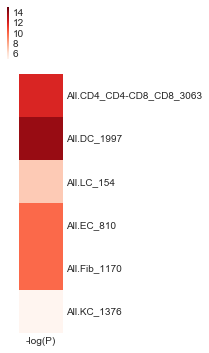

In [1258]:
sns.clustermap(pd.DataFrame({'-log(P)':[12,14,7,10,10,2]},index=['All.CD4_CD4-CD8_CD8_3063','All.DC_1997','All.LC_154','All.EC_810','All.Fib_1170','All.KC_1376']),figsize=(1,6),cmap='Reds',col_cluster=False,row_cluster=False, vmax=15,vmin=5)       
plt.show()



# SNP Enrichment Analysis 

In [1259]:
peakano_All=os.path.join(outDirAll, 'AllSamplesPeaks.ano.txt')
peakfile_All=os.path.join(outDirAll, 'PeakCount.AllSampleSkin_QNorm_Normalized.txt')

#peakano_AllCommon=os.path.join(outDirAllCommon, 'AllCommonSamplesPeaks.ano.txt')
#peakfile_AllCommon=os.path.join(outDirAllCommon, 'PeakCount.AllCommonSampleSkin_QNorm_Normalized.txt')

peakano_Norm=os.path.join(outDirNorm, 'NormPeaks.ano.txt')
peakfile_Norm=os.path.join(outDirNorm, 'PeakCount.NormSkin_QNorm_Normalized.txt')


DirNorm=os.path.join(outDirNorm,'SampleSNPEnrichment_extend0bp')
DirAllCommon=os.path.join(outDirAllCommon,'SNPEnrichment_extend0bp')
DirAll=os.path.join(outDirAll,'SampleSNPEnrichment_extend0bp')
Mkdir(DirNorm)
Mkdir(DirAllCommon)
Mkdir(DirAll)



In [1260]:
outDirAllCommon

'/Users/liuqian/Documents/A_SSC_project/A_Code_available/AllSamples_NormSScCommon/Without_Macrophage'

In [1265]:
SaveBed(FinalSNPBed[FinalSNPBed[5]=='systemic sclerosis'],'/Users/liuqian/Google Drive/SScATACseq/Figures_V18_liuqian/WithoutMacrophage/SSc_associated.SNP.txt')            



In [1261]:
FinalSNPBed=ReadBed(SNPBedFile)


In [1186]:
FinalSNPBed[1]=[int(i)-0 for i in FinalSNPBed[1]]
FinalSNPBed[2]=[int(i)+0 for i in FinalSNPBed[2]]


In [1187]:
ExtendSNPBed=SNPBedFile[:-3]+'extend0bp.bed'
SaveBed(FinalSNPBed,ExtendSNPBed)


In [1188]:

IntersectBedAll=os.path.join(DirAll,'IntersectPeakBed_SNPBed.txt')
commendline='/usr/local/bin/intersectBed -a {} -b {} -wa -wb > {}'.format(ExtendSNPBed,AllBed,IntersectBedAll)
os.system(commendline)

IntersectBedAllCommon=os.path.join(DirAllCommon,'IntersectPeakBed_SNPBed.txt')
commendline='/usr/local/bin/intersectBed -a {} -b {} -wa -wb > {}'.format(ExtendSNPBed,AllCommonBed,IntersectBedAllCommon)
os.system(commendline)

IntersectBedNorm=os.path.join(DirNorm,'IntersectPeakBed_SNPBed.txt')
commendline='/usr/local/bin/intersectBed -a {} -b {} -wa -wb > {}'.format(ExtendSNPBed,NormBed,IntersectBedNorm)
os.system(commendline)



0

In [1189]:
N=2000
LpValue=[0.05,1.0e-3,1.0e-4,1.0e-5,1.0e-6,1.0e-8]
ClusterColorsDict


{'CD31': '#EB0D8C',
 'CD4': '#EC2427',
 'CD8': '#F15E25',
 'DC': '#6CBE46',
 'EC': '#EB0D8C',
 'Fib': '#3B54A4',
 'KC': '#F6EC13',
 'LC': '#34C5F4',
 'Mac': '#231F20'}

In [1190]:

def read_ano_peak_file(File):
    F=pd.read_table(File,sep='\t',index_col=0)
    return F

def Read_IntersectBedFile(IntersectBed):
    F=pd.read_table(IntersectBed,sep='\t',header=None)
    F[5]=[i.split('(')[0].split('[')[0].rstrip(' ') for i in F[5]]
    F['Unit']=F[3]+'_'+F[5]+'_'+F[9]
    F2=F[['Unit',4]]
    F=F[[i for i in list(F) if i!=4]]
    F.index=F['Unit']
    F=F.drop_duplicates()
    F[4]=F2.groupby('Unit')[4].apply(min).loc[F.index]
    nLSP=[]
    AllDisease=set(F[5])
    
    for d in AllDisease:
        if ('at chr' not in d) and ('gene expression' not in d) and ('exon level expression' not in d) and ('serum' not in d) and ('hour' not in d) and ('pc aa c' not in d) and ('pc ae c' not in d) and ('igp' not in d) and ('sm c' not in d) and (':' not in d):                           
            f=F[F[5]==d]
            f=f.drop_duplicates()
            if len(f)>10:
                nLSP.append([d,list(f[9]), [float(i) for i in list(f[4])]])
                if d=='systemic sclerosis':
                    SSC=[d,list(f[9]), list(f[4])]
    return nLSP,SSC


#将距离Promotor区的距离大于1000bp的距离设定为远端区域这个函数是对上面函数中peak的筛选，只选择远端区域并且和SNP有Overlap的peak
def judge_long_distance(nLSP,SSC,peakano):
    ANO=read_ano_peak_file(peakano)
    def judge(i): 
        nl=[j for j in range(len(i[1])) if abs(ANO.loc[i[1][j]]['Distance to TSS'])>1000] 
        return [i[0],[i[1][m] for m in nl],[i[2][n] for n in nl]]
    lLSP=[judge(x) for x in nLSP]
    SSC=judge(SSC)
    return lLSP,SSC

def select_Disease(lLSP,SSC,sDiseaseGrasp,SSCdg):
    nlLSP=[]
    for i in lLSP:
        #if i[0]=='systemic lupus erythematosus':print len(i[1])
        try:
            i.append(round(len(i[1])/float(sDiseaseGrasp[i[0]]),4))
            nlLSP.append(i)
            #if i[0]=='systemic lupus erythematosus':print i[3]
        except :
            None
    SSC.append(round(len(SSC[1])/float(SSCdg['systemic sclerosis']),4))
    nnLSP=[i for i in nlLSP if (i[3]>0.02 and len(i[1])>10) ]
    return nlLSP,nnLSP


def calculate_SNP_enrichment(PEAK,nnLSP,N,pValue):
    print 'pValue threshold'+str(pValue)
    Cell=list(PEAK)
    Disease=[i[0] for i in nnLSP]   # the order of Disease
    SnpPeak=[[i[1][j] for j in range(len(i[1])) if i[2][j]<=pValue] for i in nnLSP]   # PeakID list of corresponding Disease Snp
    TSC=[sum(list(PEAK[i])) for i in Cell]  #Total Signal  for one cell type
    TSAC=sum(TSC)                          #Total Signal (for all cells)
    SACDisease=[sum([sum(list(PEAK.loc[j])) for j in i]) for i in SnpPeak] # all cell Signal of one deasase
    ExpectedS=[[d*(cell/TSAC) for cell in TSC] for d in SACDisease]   #the list of Expected signal for  different cells for  different disease
    ObserverS=[[sum([PEAK[j].loc[y] for y in i ]) for j in Cell] for i in SnpPeak] #the list of Observed Signal for different cells for different Disease
    SnpNumber=[int(sum([1 for j in i ])) for i in SnpPeak]
    def minus(L1,L2):return np.array(L1)-np.array(L2)
    def average_cell(Cell,Signal):   #average data according the cell group
        D=[[i,len(list(k))] for i,k in itertools.groupby([j.split('_')[0] for j in Cell])]
        NCell=[i[0] for i in D]
        bins=[i[1] for i in D]
        Bins=[0]+[sum(bins[:i+1]) for i in range(len(bins))]
        Diviation=Signal.T
        NDiviation=[np.mean(Diviation[Bins[i]:Bins[i+1]],0) for i in range(len(Bins)-1)]
        return NDiviation,NCell
    def normalize(List):    #normalize the list use the range of the list
        Range=np.ptp(List)   #range of list
        return [(i-min(List))/Range for i in List]
    def Background(N,I):
        Pn=SnpNumber[I]
        OES=ExpectedS[I]
        print 'calculate background singal for:'+Disease[I]              #Pn is the peak number (for one disease)  OES is one disease expected signal( 21 cell)
        Bk=[[sum(PEAK.loc[i]),i] for i in list(PEAK.index)]
        sBk=sorted(Bk,key=lambda i:i[0])
        L=[]
        while len(L)<N:
            a=random.randint(0,len(sBk)-Pn)
            if a not in L:L.append(a)
        Bgl=[[i,i+Pn] for i in L]   #back ground list
        bSAC=[sum([sBk[j][0] for j in range(int(i[0]),int(i[1]))]) for i in Bgl]  # back ground Singal all cell
        
            
        bS=[[b*(i/TSAC) for b in bSAC] for i in TSC]    #back ground signal  [[cell1 N background],[cell2 N background],[cell3 N background]....]
        def Root_mean_square(l,es):  #es is epected singal  for one disease for one cell;  l is back ground singal list for one disease for one cell(len(l)=N)
            X=sum([(i-es)**2 for i in l])/N
            return math.sqrt(X)
        return [Root_mean_square(bS[i],OES[i]) for i in range(len(bS))]
    def to_df(data):return pd.DataFrame(data,index=NCell,columns=Disease)
    def order(l):
        SL=sorted(l)
        return [SL.index(i) for i in l]
    rawDivision=minus(ObserverS,ExpectedS)
    BackGround=[ Background(N,I) for I in range(len(SnpNumber))]
    Signal=rawDivision/np.array(BackGround)
    NDiviation,NCell=average_cell(Cell,Signal)
    NNDiviation=np.array([normalize(List) for List in np.array(NDiviation).T]).T
    orderDiviation=[order(list(l)) for l in np.array(NDiviation).T ]
    Diviation0,Diviation1=map(to_df,[NDiviation,NNDiviation])
    return Diviation0,Diviation1,orderDiviation,NDiviation,NNDiviation,Disease,NCell

def write_to_file(Diviation0,Diviation1,pValue,N,outfile):
        Diviation1.to_csv('%s_Bg%s_pVal%s.txt' % (outfile,N,pValue),sep='\t')
        Diviation0.to_csv('%s_Bg%s_pVal%s.rawdata.txt' % (outfile,N,pValue),sep='\t')

        

In [1191]:
ANO_All,PEAK_All=map(read_ano_peak_file,[peakano_All,peakfile_All])
#ANO_AllCommom,PEAK_AllCommon=map(read_ano_peak_file,[peakano_AllCommon,peakfile_AllCommon])
ANO_Norm,PEAK_Norm=map(read_ano_peak_file,[peakano_Norm,peakfile_Norm])



In [1192]:
PEAK_All=PEAK_All[sorted(list(PEAK_All))]
#PEAK_AllCommon=PEAK_AllCommon[sorted(list(PEAK_AllCommon))]
PEAK_Norm=PEAK_Norm[sorted(list(PEAK_Norm))]


In [1193]:
FinalSNPBed['X']=[1]*(len(FinalSNPBed))
NumberDF=FinalSNPBed.sort_values(5).groupby(5)['X'].apply(sum,axis=0)
NumberDF=NumberDF[NumberDF>100]
sDiseaseGrasp={}
for i in NumberDF.index:
    sDiseaseGrasp[i] = NumberDF.loc[i]
SSCdg={'systemic sclerosis':NumberDF.loc['systemic sclerosis']} 



In [1194]:
nLSP_All,SSC_All=Read_IntersectBedFile(IntersectBedAll)
#nLSP_AllCommon,SSC_AllCommon=Read_IntersectBedFile(IntersectBedAllCommon)
nLSP_Norm,SSC_Norm=Read_IntersectBedFile(IntersectBedNorm)



In [1195]:
SSCdg

{'systemic sclerosis': 498}

In [1196]:
def SaveSSc(IntersectBedFile,SSc_Peaks,Dir):
    df=pd.read_table(IntersectBedFile,sep='\t',header=None)
    df=df[df[5]=='systemic sclerosis']
    df.index=df[9]
    df[1]=df[1]+0
    df[2]=df[2]-0
    SaveBed(df.loc[SSc_Peaks], os.path.join(Dir, 'SSc_SNP_OverlapPeaks.txt'))

SaveSSc(IntersectBedAll,list(set(SSC_All[1])),DirAll)
#SaveSSc(IntersectBedAllCommon,list(set(SSC_AllCommon[1])),DirAllCommon)
SaveSSc(IntersectBedNorm,list(set(SSC_Norm[1])),DirNorm)



In [1197]:
# lLSP_All,SSC_All=judge_long_distance(nLSP_All,SSC_All,peakano_All)
# lLSP_AllCommon,SSC_AllCommon=judge_long_distance(nLSP_AllCommon,SSC_AllCommon,peakano_AllCommon)
# lLSP_Norm,SSC_Norm=judge_long_distance(nLSP_Norm,SSC_Norm,peakano_Norm)


In [1198]:
RawLSP_All,nnLSP_All=select_Disease(nLSP_All,SSC_All,sDiseaseGrasp,SSCdg)
#RawLSP_AllCommon,nnLSP_AllCommon=select_Disease(nLSP_AllCommon,SSC_AllCommon,sDiseaseGrasp,SSCdg)
RawLSP_Norm,nnLSP_Norm=select_Disease(nLSP_Norm,SSC_Norm,sDiseaseGrasp,SSCdg)

Filter_nnLSP_All=[i for i in nnLSP_All if ('alcohol' not in i[0]) and ('bipolar' not in i[0]) and ('gene expression' not in i[0]) and ('hypertension' not in i[0]) and ('mean' not in i[0]) and ('neuro' not in i[0]) and ('obesity' not in i[0]) and ('total' not in i[0]) and ('waist'not in i[0]) and ('weight'not in i[0]) and ('count'not in i[0]) and ('year'not in i[0]) and ('age' not in i[0]) and ('size' not in i[0]) and ('level' not in i[0]) and ('pressure' not in i[0]) and ('ratio' not in i[0]) and ('concentration' not in i[0])]                                                                
#Filter_nnLSP_AllCommon=[i for i in nnLSP_AllCommon if ('alcohol' not in i[0]) and ('bipolar' not in i[0]) and ('gene expression' not in i[0]) and ('hypertension' not in i[0]) and ('mean' not in i[0]) and ('neuro' not in i[0]) and ('obesity' not in i[0]) and ('total' not in i[0]) and ('waist'not in i[0]) and ('weight'not in i[0]) and ('count'not in i[0]) and ('year'not in i[0]) and ('age' not in i[0]) and ('size' not in i[0]) and ('level' not in i[0]) and ('pressure' not in i[0]) and ('ratio' not in i[0]) and ('concentration' not in i[0])]                                                                
Filter_nnLSP_Norm=[i for i in nnLSP_Norm if ('alcohol' not in i[0]) and ('bipolar' not in i[0]) and ('gene expression' not in i[0]) and ('hypertension' not in i[0]) and ('mean' not in i[0]) and ('neuro' not in i[0]) and ('obesity' not in i[0]) and ('total' not in i[0]) and ('waist'not in i[0]) and ('weight'not in i[0]) and ('count'not in i[0]) and ('year'not in i[0]) and ('age' not in i[0]) and ('size' not in i[0]) and ('level' not in i[0]) and ('pressure' not in i[0]) and ('ratio' not in i[0]) and ('concentration' not in i[0])]                                                                



In [1199]:
for i in Filter_nnLSP_All:
    print i[0] 

rheumatoid arthritis
male-pattern baldness
simpson-angus scale
colorectal tumors
ulcerative colitis
postoperative nausea and vomiting
paclitaxel-induced cytotoxicity in lymphoblastoid cell lines
normoxic and mild-hypoxic adaptation in populations residing at low and moderate altitudes
rheumatoid arthritis, gender differentiated
response to chronic hepatitis c interferon-alpha and ribavirin therapy
balding type 1
severe diabetic retinopathy in type 1 diabetes
primary rhegmatogenous retinal detachment
hypertriglyceridemia
multiple myeloma
airflow obstruction
college completion
autism spectrum disorder or schizophrenia
hiv-1 susceptibility
type 1 diabetes, rheumatoid arthritis, combined case analysis, gender differentiated
refractive error
inflammatory bowel disease
peak expiratory flow
fev1
hypothyroidism
ldl cholesterol change with statins
transmission distortion
general cognitive ability
central corneal thickness
pancreatic cancer
type 1 diabetes, combined control dataset, gender diffe

In [1200]:
#Manually selected the autoimmune/inflammatory/skin disease/
Diseases=["systemic sclerosis",'rheumatoid arthritis','ulcerative colitis','severe diabetic retinopathy in type 1 diabetes','inflammatory bowel disease','kawasaki disease','vitiligo','myasthenia gravis','type 1 diabetes, combined control dataset',"chronic kidney disease","asthma","alopecia areata","psoriasis","ankylosing spondylitis",'celiac disease','primary sclerosing cholangitis','systemic lupus erythematosus','sarcoidosis',"crohn's disease",'endometriosis','type 1 diabetes','adult asthma','cardiac neonatal lupus','atopic dermatitis']                                                         
Clean_nnLSP_All=[i for i in nnLSP_All if i[0] in Diseases]                                                                
#Clean_nnLSP_AllCommon=[i for i in nnLSP_AllCommon if i[0] in Diseases]                                                                
Clean_nnLSP_Norm=[i for i in nnLSP_Norm if i[0] in Diseases]   




In [1201]:
#############
def GetEnrichmentScore(PEAK,Filter_nnLSP,Dir):
    outfile=os.path.join(Dir,'SNP.Enrichment')
    OrDV=[]
    OrDiv=[]
    rawDiv=[]
    for pValue in LpValue:
        Diviation0,Diviation1,orderDiviation,NDiviation,NNDiviation,Disease,Ncell=calculate_SNP_enrichment(PEAK,Filter_nnLSP,N,pValue)                
        write_to_file(Diviation0,Diviation1,pValue,N,outfile)
        OrDV.append(orderDiviation)
        OrDiv.append(NNDiviation)
        rawDiv.append(NDiviation)

    L=np.array(OrDiv).T
    bl=[round(-math.log(i,10),1) for i in LpValue]
    
    #Diseases=list(set(['ankylosing spondylitis','asthma','atopic dermatitis','celiac disease','chronic kidney disease',"crohn's disease",'rheumatoid arthritis','multiple sclerosis','inflammatory bowel disease','psoriasis','systemic lupus erythematosus','celiac disease',"crohn's disease",'inflammatory bowel disease','primary biliary cirrhosis','ulcerative colitis','sarcoidosis','systemic sclerosis']))                  
    EnrichS=pd.DataFrame({},index=Ncell,columns=LpValue)
    diseases=[i[0] for i in Filter_nnLSP]
    for p in LpValue:
        File='{}_Bg2000_pVal{}.txt'.format(outfile,str(p))
        DF=pd.read_table(File,sep='\t',index_col=0)
        EnrichS[p]=list(DF['systemic sclerosis'])
        if p==1e-06:
            HMPDF=DF[diseases]
            HMPDF.index=Ncell

    Raw_EnrichS=pd.DataFrame({},index=Ncell,columns=LpValue)
    for p in LpValue:
        File='{}_Bg2000_pVal{}.rawdata.txt'.format(outfile,str(p))
        DF=pd.read_table(File,sep='\t',index_col=0)
        Raw_EnrichS[p]=list(DF['systemic sclerosis'])
        if p==1e-06:
            Raw_HMPDF=DF[diseases]
            Raw_HMPDF.index=Ncell
    Save(EnrichS,outfile+'.EnrichmentScoreNorm01.SSc.txt')
    Save(Raw_EnrichS,outfile+'.EnrichmentScoreRaw.SSc.txt')
    Save(HMPDF,outfile+'.EnrichmentScoreNorm01.pVal1e-6.txt')
    Save(Raw_HMPDF,outfile+'.EnrichmentScoreRaw.pVal1e-6.txt')
    return EnrichS,Raw_EnrichS,HMPDF,Raw_HMPDF



In [1202]:

EnrichS_All,Raw_EnrichS_All,HMPDF_All,Raw_HMPDF_All=GetEnrichmentScore(PEAK_All,Clean_nnLSP_All,DirAll)
                              
EnrichS_Norm,Raw_EnrichS_Norm,HMPDF_Norm,Raw_HMPDF_Norm=GetEnrichmentScore(PEAK_Norm,Clean_nnLSP_Norm,DirNorm)

#EnrichS_AllCommon,Raw_EnrichS_AllCommon,HMPDF_AllCommon,Raw_HMPDF_AllCommon=GetEnrichmentScore(PEAK_AllCommon,Clean_nnLSP_AllCommon,DirAllCommon) 



pValue threshold0.05
calculate background singal for:rheumatoid arthritis
calculate background singal for:ulcerative colitis
calculate background singal for:severe diabetic retinopathy in type 1 diabetes
calculate background singal for:inflammatory bowel disease
calculate background singal for:kawasaki disease
calculate background singal for:vitiligo
calculate background singal for:myasthenia gravis
calculate background singal for:type 1 diabetes, combined control dataset
calculate background singal for:systemic sclerosis
calculate background singal for:chronic kidney disease
calculate background singal for:asthma
calculate background singal for:alopecia areata
calculate background singal for:psoriasis
calculate background singal for:ankylosing spondylitis
calculate background singal for:celiac disease
calculate background singal for:primary sclerosing cholangitis
calculate background singal for:systemic lupus erythematosus
calculate background singal for:sarcoidosis
calculate backgrou

calculate background singal for:chronic kidney disease
calculate background singal for:asthma
calculate background singal for:alopecia areata
calculate background singal for:psoriasis
calculate background singal for:celiac disease
calculate background singal for:systemic lupus erythematosus
calculate background singal for:sarcoidosis
calculate background singal for:crohn's disease
calculate background singal for:endometriosis
calculate background singal for:type 1 diabetes
calculate background singal for:adult asthma
calculate background singal for:atopic dermatitis
pValue threshold0.001
calculate background singal for:rheumatoid arthritis
calculate background singal for:ulcerative colitis
calculate background singal for:severe diabetic retinopathy in type 1 diabetes
calculate background singal for:inflammatory bowel disease
calculate background singal for:kawasaki disease
calculate background singal for:myasthenia gravis
calculate background singal for:vitiligo
calculate background si

In [1203]:
#Average Before
DirNorm=os.path.join(DirNorm,'AverageCelltypeBefore')
#DirAllCommon=os.path.join(DirAllCommon,'AverageCelltypeBefore')
DirAll=os.path.join(DirAll,'AverageCelltypeBefore')
Mkdir(DirNorm)
#Mkdir(DirAllCommon)
Mkdir(DirAll)




In [1204]:
def AverageCelltype(PEAK_DF):
    X=PEAK_DF.T
    X['Celltype']=[i.split('_')[0] for i in list(PEAK_DF)]
    return X.groupby('Celltype').apply(np.mean)
    
    

PEAK_All_AB=AverageCelltype(PEAK_All)
PEAK_Norm_AB=AverageCelltype(PEAK_Norm)
#PEAK_AllCommon_AB=AverageCelltype(PEAK_AllCommon)



In [1205]:

EnrichS_All_AB,Raw_EnrichS_All_AB,HMPDF_All_AB,Raw_HMPDF_All_AB=GetEnrichmentScore(PEAK_All,Clean_nnLSP_All,DirAll)
                              
EnrichS_Norm_AB,Raw_EnrichS_Norm_AB,HMPDF_Norm_AB,Raw_HMPDF_Norm_AB=GetEnrichmentScore(PEAK_Norm,Clean_nnLSP_Norm,DirNorm)

#EnrichS_AllCommon_AB,Raw_EnrichS_AllCommon_AB,HMPDF_AllCommon_AB,Raw_HMPDF_AllCommon_AB=GetEnrichmentScore(PEAK_AllCommon,Clean_nnLSP_AllCommon,DirAllCommon) 



pValue threshold0.05
calculate background singal for:rheumatoid arthritis
calculate background singal for:ulcerative colitis
calculate background singal for:severe diabetic retinopathy in type 1 diabetes
calculate background singal for:inflammatory bowel disease
calculate background singal for:kawasaki disease
calculate background singal for:vitiligo
calculate background singal for:myasthenia gravis
calculate background singal for:type 1 diabetes, combined control dataset
calculate background singal for:systemic sclerosis
calculate background singal for:chronic kidney disease
calculate background singal for:asthma
calculate background singal for:alopecia areata
calculate background singal for:psoriasis
calculate background singal for:ankylosing spondylitis
calculate background singal for:celiac disease
calculate background singal for:primary sclerosing cholangitis
calculate background singal for:systemic lupus erythematosus
calculate background singal for:sarcoidosis
calculate backgrou

calculate background singal for:chronic kidney disease
calculate background singal for:asthma
calculate background singal for:alopecia areata
calculate background singal for:psoriasis
calculate background singal for:celiac disease
calculate background singal for:systemic lupus erythematosus
calculate background singal for:sarcoidosis
calculate background singal for:crohn's disease
calculate background singal for:endometriosis
calculate background singal for:type 1 diabetes
calculate background singal for:adult asthma
calculate background singal for:atopic dermatitis
pValue threshold0.001
calculate background singal for:rheumatoid arthritis
calculate background singal for:ulcerative colitis
calculate background singal for:severe diabetic retinopathy in type 1 diabetes
calculate background singal for:inflammatory bowel disease
calculate background singal for:kawasaki disease
calculate background singal for:myasthenia gravis
calculate background singal for:vitiligo
calculate background si

In [1209]:
Raw_EnrichS_Norm_AB

,0.05,0.001,0.0001,1e-05,1e-06,1e-08
CD4,-0.173789,-0.255077,-0.273435,-0.276213,-0.270390,-0.190435
CD8,-0.125296,-0.190067,-0.203746,-0.205816,-0.199556,-0.175877
DC,-0.196144,-0.289862,-0.310723,-0.313880,-0.308812,-0.050682
EC,0.118993,0.172121,0.184508,0.186383,0.194390,-0.062407
Fib,0.036360,0.091409,0.097988,0.098983,0.094108,0.333488
KC,0.237006,0.322262,0.345455,0.348965,0.333775,-0.030360
LC,-0.124589,-0.209260,-0.224320,-0.226600,-0.222321,-0.116576


# Genomica Enhrichment analysis (SNP sites=TF bing sites)

In [472]:
DirNorm=os.path.join(outDirNorm,'SampleSNPEnrichment_extend1000bp_Genomica')
DirAllCommon=os.path.join(outDirAllCommon,'SNPEnrichment_extend1000bp_Genomica')
DirAll=os.path.join(outDirAll,'SampleSNPEnrichment_extend1000bp_Genomica')
Mkdir(DirNorm)
Mkdir(DirAllCommon)
Mkdir(DirAll)



In [493]:
def meancenter(L):
        mean=np.mean(L)
        return np.array([i-mean for i in L])

def GetFile(DF_Normlog,Clean_nnLSP,Dir):
    DF=DF_Normlog.copy()
    DF=DF.apply(meancenter,axis=1)
    DF['Weight']=[1]*len(DF)
    Columns=['Weight']+list(DF)[:-1]
    DF.to_csv(os.path.join(Dir,'PeakCount.QNorm_Normalized.for_genomica.rowMeancenter.txt'),sep='\t',columns=Columns)
    DF=pd.DataFrame({},index=list(DF_Normlog.index))
    for i in Clean_nnLSP:
        print i[0]
        DF[i[0]]=[1 if j in i[1] else 0 for j in DF.index]
    Save(DF, os.path.join(Dir,'DiseaseSNP_inPeaks.tab'))
    
    
    
    

In [494]:
GetFile(AllDF_Normlog,Clean_nnLSP_All,DirAll)
GetFile(AllCommonDF_Normlog,Clean_nnLSP_AllCommon,DirAllCommon)
GetFile(NormDF_Normlog,Clean_nnLSP_Norm,DirNorm)



rheumatoid arthritis
ulcerative colitis
severe diabetic retinopathy in type 1 diabetes
kawasaki disease
vitiligo
type 1 diabetes, combined control dataset
ankylosing spondylitis
systemic lupus erythematosus
systemic sclerosis
chronic kidney disease
asthma
alopecia areata
psoriasis
celiac disease
crohn's disease
type 1 diabetes
adult asthma
cardiac neonatal lupus
atopic dermatitis
rheumatoid arthritis
diabetic nephropathy
urinary albumin-to-creatinine ratio
2-hydroxyisobutyrate concentration
simpson-angus scale
ulcerative colitis
postoperative nausea and vomiting
hypertension
rheumatoid arthritis, gender differentiated
response to chronic hepatitis c interferon-alpha and ribavirin therapy
fasting blood glucose
cognitive response of healthy volunteers to topiramate treatment as measure by the immediate story recall cognitive test
severe diabetic retinopathy in type 1 diabetes
psoriasis and/or psoriatic arthritis
agreeableness
alcohol consumption
spatial working memory strategy
autism wit

type 1 diabetes, combined control dataset, gender differentiated
alzheimer's disease
cisplatin-induced cytotoxicity as measured by cisplatin ic50
weight in type 2 diabetes
diastolic blood pressure
prop taste detection threshold
kawasaki disease
nausea in response to topiramate treatment in healthy volunteers
variant creutzfeldt-jakob disease
pulse pressure
stabilized warfarin dose
late onset alzheimer's disease
bipolar disorder and schizophrenia
hypertension, combined control dataset, gender differentiated
bipolar disorder, gender differentiated
type 1 diabetes, combined control dataset
ankylosing spondylitis
hypertension, combined control dataset
plasma renin activity
antidepressant drug treatment outcome in depression
lp-pla2 activity
bipolar disorder
partial epilepsy
epilepsy
primary biliary cirrhosis
suicide attempts in mood disorder patients
systolic blood pressure
grave's disease
chronic obstructive pulmonary disease
body mass index
brain atrophy
type 1 diabetes, rheumatoid arthr